# Load Data

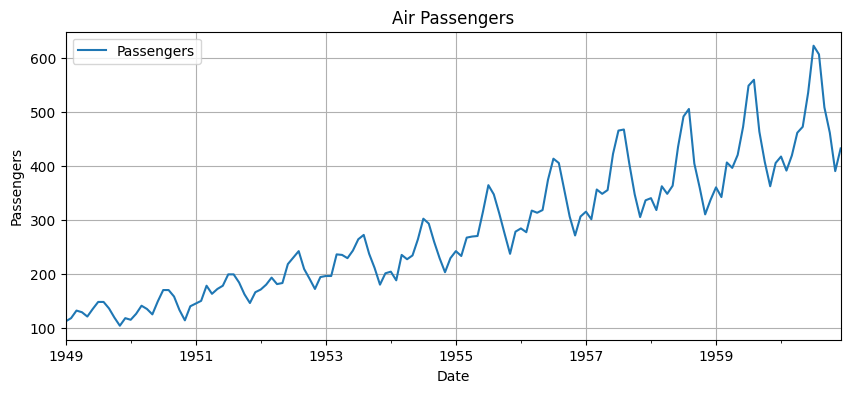

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import warnings

warnings.filterwarnings("ignore")


# Load the AirPassengers dataset
url = "https://raw.githubusercontent.com/jbrownlee/Datasets/master/airline-passengers.csv"
df = pd.read_csv(url, parse_dates=['Month'], index_col='Month')

# Visualize the series
df.plot(figsize=(10, 4), title="Air Passengers")
plt.xlabel("Date")
plt.ylabel("Passengers")
plt.grid()
plt.show()

# Split Data

In [2]:
def create_time_series_features(data, lookback_window=12):
    """
    Create features for time series forecasting using lagged values
    """
    X, y = [], []
    
    for i in range(lookback_window, len(data)):
        # Use previous 'lookback_window' values as features
        X.append(data[i-lookback_window:i])
        y.append(data[i])
    
    return np.array(X), np.array(y)

In [3]:
lag = 12
X = df['Passengers'][:-lag]
y = df['Passengers'][lag:]

# Define sizes
n = len(X)
train_size = int(n * 0.7)
val_size = int(n * 0.15)
test_size = n - train_size - val_size

# Split the series
X_train = X[:train_size]
y_train = y[:train_size]
X_val = X[train_size:train_size + val_size]
y_val = y[train_size:train_size + val_size]
X_test = X[train_size + val_size:]
y_test = y[train_size + val_size:]

# Confirm sizes
print(f"Train starts on: {X_train.index[0]}, Train ends on: {X_train.index[-1]}")
print(f"Validation starts on: {X_val.index[0]}, Validation ends on: {X_val.index[-1]}")
print(f"Test starts on: {X_test.index[0]}, Test ends on: {X_test.index[-1]}")
print(f"Train size: {len(X_train)}, Val size: {len(X_val)}, Test size: {len(X_test)}")

Train starts on: 1949-01-01 00:00:00, Train ends on: 1956-08-01 00:00:00
Validation starts on: 1956-09-01 00:00:00, Validation ends on: 1958-03-01 00:00:00
Test starts on: 1958-04-01 00:00:00, Test ends on: 1959-12-01 00:00:00
Train size: 92, Val size: 19, Test size: 21


In [4]:
from sklearn.preprocessing import StandardScaler

# Scale the features
scaler_X = StandardScaler()
scaler_y = StandardScaler()

X_train_scaled = scaler_X.fit_transform(np.array(X_train).reshape(-1,1))
X_val_scaled = scaler_X.transform(np.array(X_val).reshape(-1,1))
y_train_scaled = scaler_y.fit_transform(np.array(y_train).reshape(-1, 1)).ravel()
y_val_scaled = scaler_y.transform(np.array(y_val).reshape(-1, 1)).ravel()


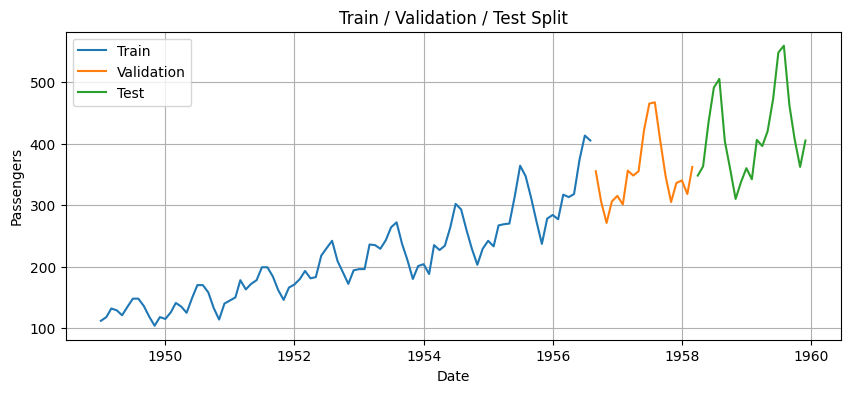

In [5]:
plt.figure(figsize=(10, 4))
plt.plot(X_train, label="Train")
plt.plot(X_val, label="Validation")
plt.plot(X_test, label="Test")
plt.title("Train / Validation / Test Split")
plt.xlabel("Date")
plt.ylabel("Passengers")
plt.legend()
plt.grid()
plt.show()

# Base Models

In [6]:
from abc import ABC, abstractmethod
from statsmodels.tsa.arima.model import ARIMA
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error
from copy import deepcopy

class AbstractBaseModel (ABC):

    def __init__(self, model, hparams, *args, **kwagrs):
        self.model = model
        self.hparams = hparams
        self.fitness_score = 0.0
        self.forecast = None

    @abstractmethod
    def train(self, X_train, y_train):
        raise NotImplementedError("Subclasses must implement train method")

    @abstractmethod
    def predict(self, X_test):
        raise NotImplementedError("Subclasses must implement predict method")

    @abstractmethod
    def get_name(self):
        raise NotImplementedError("Subclasses must implement get_name method")
    
    @abstractmethod
    def crossover(self, other):
        raise NotImplementedError("Subclasses must implement crossover method")

    @abstractmethod
    def mutate(self):
        raise NotImplementedError("Subclasses must implement mutate method")
    
    def calculate_fitness(self, pred, y_test, diversity_score):
        alpha = 0.9
        beta = 0.1
        self.fitness_score = (alpha * 1/(np.sqrt(mean_squared_error(y_test, pred)) + 1e-8)) + (beta * diversity_score)
        return self.fitness_score
    
    def __str__(self):
        return str(type(self).__name__) + ' ' + str(self.hparams) + ' Fitness: ' + str(self.fitness_score)
    
    def __repr__(self):
        return str(type(self).__name__) + ' ' + str(self.hparams) + ' Fitness: ' + str(self.fitness_score)


class ArimaModel(AbstractBaseModel):

    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)
    
    def train(self, X_train, y_train):
        p = self.hparams['p']
        d = self.hparams['d']
        q = self.hparams['q']
        self.model = ARIMA(X_train, order=(p, d, q)).fit()
    
    def predict(self, X_test):
        self.forecast = self.model.forecast(steps=len(X_test))
        return self.forecast
    
    @classmethod
    def get_name(cls):
        return 'arima'
    
    def crossover(self, other):
        if not isinstance(other, ArimaModel):
            raise ValueError("Can only crossover with another ArimaModel")
        
        child1 = deepcopy(self)
        child2 = deepcopy(other)
        
        if np.random.random() < 0.5:
            child1.hparams['p'], child2.hparams['p'] = child2.hparams['p'], child1.hparams['p']
        if np.random.random() < 0.5:
            child1.hparams['d'], child2.hparams['d'] = child2.hparams['d'], child1.hparams['d']
        if np.random.random() < 0.5:
            child1.hparams['q'], child2.hparams['q'] = child2.hparams['q'], child1.hparams['q']
        
        child1.fitness_score = 0.0
        child2.fitness_score = 0.0
        
        return child1, child2
    
    def mutate(self):
        # Randomly select which parameter to mutate
        mutation_param = np.random.choice(['p', 'd', 'q'])
        
        if mutation_param == 'p':
            self.hparams['p'] = np.random.randint(0, 5)
        elif mutation_param == 'd':
            self.hparams['d'] = np.random.randint(0, 2)
        elif mutation_param == 'q':
            self.hparams['q'] = np.random.randint(0, 5)
        
        self.fitness_score = 0.0
        
        return self

class SVRModel (AbstractBaseModel):

    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)

    def train(self, X_train, y_train):
        kernel = self.hparams['kernel']
        c = self.hparams['c']
        gamma = self.hparams['gamma']
        epsilon = self.hparams['epsilon']
        self.model = SVR(kernel=kernel, C=c, gamma=gamma, epsilon=epsilon)
        self.model.fit(X_train, y_train)
    
    def predict(self, X_test):
        self.forecast = self.model.predict(X_test)
        return self.forecast
    
    @classmethod
    def get_name(cls):
        return 'svr'
    
    def crossover(self, other):
        if not isinstance(other, SVRModel):
            raise ValueError("Can only crossover with another SVRModel")
        
        child1 = deepcopy(self)
        child2 = deepcopy(other)
        
        if np.random.random() < 0.5:
            child1.hparams['kernel'], child2.hparams['kernel'] = child2.hparams['kernel'], child1.hparams['kernel']
        
        if np.random.random() < 0.5:
            alpha = np.random.random()
            c1, c2 = child1.hparams['c'], child2.hparams['c']
            child1.hparams['c'] = alpha * c1 + (1 - alpha) * c2
            child2.hparams['c'] = alpha * c2 + (1 - alpha) * c1
        
        if np.random.random() < 0.5:
            alpha = np.random.random()
            eps1, eps2 = child1.hparams['epsilon'], child2.hparams['epsilon']
            child1.hparams['epsilon'] = alpha * eps1 + (1 - alpha) * eps2
            child2.hparams['epsilon'] = alpha * eps2 + (1 - alpha) * eps1
        
        child1.fitness_score = 0.0
        child2.fitness_score = 0.0
        
        return child1, child2
    
    def mutate(self):
        
        # Randomly select which parameter to mutate
        mutation_param = np.random.choice(['kernel', 'c', 'epsilon'])
        
        if mutation_param == 'kernel':
            self.hparams['kernel'] = np.random.choice(["linear", "rbf", "poly"])
        
        elif mutation_param == 'c':
            current_c = self.hparams['c']
            noise = np.random.normal(0, current_c * 0.1)  # 10% noise
            self.hparams['c'] = max(0.1, min(100, current_c + noise))
        
        elif mutation_param == 'epsilon':
            current_eps = self.hparams['epsilon']
            noise = np.random.normal(0, current_eps * 0.1)  # 10% noise
            self.hparams['epsilon'] = max(0.001, min(0.5, current_eps + noise))

        self.fitness_score = 0.0
        
        return self
    
class MLPModel (AbstractBaseModel):

    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)

    def train(self, X_train, y_train):
        hidden_layer_sizes = self.hparams['hidden_layer_sizes']
        learning_rate = self.hparams['learning_rate']
        
        hidden_layer_sizes = (int(hidden_layer_sizes),)
        
        self.model = MLPRegressor(hidden_layer_sizes=hidden_layer_sizes,
                            learning_rate_init=learning_rate,
                            max_iter=500, random_state=42)
        self.model.fit(X_train, y_train)
    
    def predict(self, X_test):
        self.forecast = self.model.predict(X_test)
        return self.forecast
    
    @classmethod
    def get_name(cls):
        return 'mlp'
    
    def crossover(self, other):
        if not isinstance(other, MLPModel):
            raise ValueError("Can only crossover with another MLPModel")
        
        child1 = deepcopy(self)
        child2 = deepcopy(other)
        
        if np.random.random() < 0.5:
            alpha = np.random.random()
            h1, h2 = child1.hparams['hidden_layer_sizes'], child2.hparams['hidden_layer_sizes']
            child1.hparams['hidden_layer_sizes'] = int(alpha * h1 + (1 - alpha) * h2)
            child2.hparams['hidden_layer_sizes'] = int(alpha * h2 + (1 - alpha) * h1)
        
        if np.random.random() < 0.5:
            alpha = np.random.random()
            lr1, lr2 = child1.hparams['learning_rate'], child2.hparams['learning_rate']
            child1.hparams['learning_rate'] = alpha * lr1 + (1 - alpha) * lr2
            child2.hparams['learning_rate'] = alpha * lr2 + (1 - alpha) * lr1
        
        child1.fitness_score = 0.0
        child2.fitness_score = 0.0
        
        return child1, child2
    
    def mutate(self):
        
        # Randomly select which parameter to mutate
        mutation_param = np.random.choice(['hidden_layer_sizes', 'learning_rate'])
        
        if mutation_param == 'hidden_layer_sizes':
            current_size = self.hparams['hidden_layer_sizes']
            change = np.random.randint(-10, 11)  # Change by -10 to +10
            self.hparams['hidden_layer_sizes'] = max(5, min(50, current_size + change))
        
        elif mutation_param == 'learning_rate':
            current_lr = self.hparams['learning_rate']
            noise = np.random.normal(0, current_lr * 0.1)  # 10% noise
            self.hparams['learning_rate'] = max(0.001, min(0.1, current_lr + noise))

        self.fitness_score = 0.0
        
        return self

    
class EnsembleModel (AbstractBaseModel):

    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)

    def train(self, X_train, y_train):
        for model in self.hparams.keys():
            self.hparams[model].train(X_train, y_train)
    
    def predict(self, X_test):
        self.forecast = 0.0
        for model in self.hparams.keys():
            self.forecast += self.hparams[model].predict(X_test)
        self.forecast /= len(self.hparams.keys()) # Average of all predictions
        return self.forecast
    
    @classmethod
    def get_name(cls):
        return 'ensemble'
    
    def crossover(self, other):
        return self, other
    
    def mutate(self):
        return self


# Model Diversity and Evaluation

In [7]:
def print_population(population):
    for model in population.keys():
        for individual in population[model]:
            print(individual)
    print('============================\n\n')


def init_population(population_size, pool_of_models):
    population = {}

    for model in pool_of_models:
        population[model.get_name()] = []
        if model is ArimaModel:
            for _ in range(population_size):
                population[model.get_name()].append(
                    ArimaModel(
                        ARIMA,
                        {
                            'p': np.random.randint(0, 5),
                            'd': np.random.randint(0, 2),
                            'q': np.random.randint(0, 5)
                        }
                    )
                )
        elif model is SVRModel:
            for _ in range(population_size):
                population[model.get_name()].append(
                    SVRModel(
                        SVR,
                        {
                            'kernel' : np.random.choice(["linear", "rbf", "poly"]),
                            'c' : np.random.uniform(0.1, 100),
                            'gamma': np.random.choice(['scale']),
                            'epsilon' : np.random.uniform(0.001, 0.5)
                        }
                    )
                )
        elif model is MLPModel:
            for _ in range(population_size):
                population[model.get_name()].append(
                    MLPModel(
                        MLPRegressor,
                        {
                            'hidden_layer_sizes': np.random.randint(5, 50),
                            'learning_rate': np.random.uniform(0.001, 0.1)
                        }
                    )
                )
    
    return population

In [8]:
from itertools import zip_longest


def individual_diversity(population, X_test):
    
    # Get predictions from all models
    model_predictions = {}
    model_names = []
    
    # print("Generating predictions from individual models...")
    for model in population.keys():
        model_names.append(model)
        model_predictions[model] = []
        for individual in population[model]:
            model_predictions[model].append(individual.predict(X_test))
    
    # Convert to numpy array for easier computation
    pred_matrix = [list(lst) for lst in zip_longest(*model_predictions.values(), fillvalue=None)]
    
    # Calculate pairwise disagreements using MSE
    n_rows, n_cols = np.shape(pred_matrix)[0:2]
    disagreement_matrix = np.zeros((n_rows, n_cols))

    for i in range(n_rows):  # For each model instance (row)
        for j in range(n_cols):  # For each model type (column)
            ref_pred = pred_matrix[i][j]
            mse_list = []
            for k in range(n_cols):
                if k != j:
                    comp_pred = pred_matrix[i][k]
                    mse = mean_squared_error(ref_pred, comp_pred)
                    mse_list.append(mse)
            disagreement_matrix[i][j] = np.mean(mse_list)
    
    return disagreement_matrix

In [9]:
def individual_evaluation_with_diversity(population, X_train, y_train, X_val, y_val):

    for model in population.keys():
        for individual in population[model]:
            individual.train(X_train, y_train)
            pred = individual.predict(X_val)
            # individual.calculate_fitness(pred, y_val)

    disagreement_matrix = individual_diversity(population, X_val)

    i = 0
    for model in population.keys():
        j = 0
        for individual in population[model]:
            pred = individual.predict(X_val)
            individual.calculate_fitness(pred, y_val, disagreement_matrix[j][i])
            j +=1
        i += 1


In [10]:
def individual_evaluation(population, X_train, y_train, X_val, y_val):

    for model in population.keys():
        for individual in population[model]:
            individual.train(X_train, y_train)
            pred = individual.predict(X_val)
            individual.calculate_fitness(pred, y_val)


In [11]:
from itertools import combinations


def calculate_model_diversity(models_dict, X_test):
    """
    Calculate disagreement measure (diversity) for ensemble models using MSE.
    
    Parameters:
    -----------
    models_dict : dict
        Dictionary with model names as keys and trained model objects as values
        Format: {'model_name': model_object, ...}
    X_test : array-like
        Test data for generating predictions
    
    Returns:
    --------
    float : Average disagreement measure across all model pairs
    dict : Dictionary with detailed diversity metrics and model predictions
    """
    
    if len(models_dict) < 2:
        raise ValueError("Need at least 2 models to calculate diversity")
    
    # Get predictions from all models
    model_predictions = {}
    model_names = []
    
    # print("Generating predictions from individual models...")
    for model_name, model_obj in models_dict.items():
        predictions = model_obj.predict(X_test)
        model_predictions[model_name] = predictions
        model_names.append(model_name)
        # print(f"  {model_name}: predictions generated")
    
    # Convert to numpy array for easier computation
    pred_matrix = np.column_stack([model_predictions[name] for name in model_names])
    n_models = len(model_names)
    
    # Calculate pairwise disagreements using MSE
    pairwise_disagreements = []
    disagreement_matrix = np.zeros((n_models, n_models))
    model_pairs = []
    
    # print("\nCalculating pairwise disagreements...")
    for i, j in combinations(range(n_models), 2):
        model_i = model_names[i]
        model_j = model_names[j]
        pred_i = pred_matrix[:, i]
        pred_j = pred_matrix[:, j]
        
        disagreement = mean_squared_error(pred_i, pred_j)
        pairwise_disagreements.append(disagreement)
        disagreement_matrix[i, j] = disagreement
        disagreement_matrix[j, i] = disagreement  # Symmetric matrix
        model_pairs.append((model_i, model_j))
        
        # print(f"  {model_i} vs {model_j}: MSE = {disagreement:.6f}")
    
    # Calculate overall diversity measure
    avg_disagreement = np.mean(pairwise_disagreements)
    
    # Additional diversity statistics
    diversity_stats = {
        'average_disagreement': avg_disagreement,
        'pairwise_disagreements': pairwise_disagreements,
        'disagreement_matrix': disagreement_matrix,
        'model_pairs': model_pairs,
        'min_disagreement': np.min(pairwise_disagreements),
        'max_disagreement': np.max(pairwise_disagreements),
        'std_disagreement': np.std(pairwise_disagreements),
        'n_pairs': len(pairwise_disagreements),
        'model_names': model_names,
        'individual_predictions': model_predictions
    }
    
    return avg_disagreement, diversity_stats

In [12]:
def plot_forecasts(models, actual):
    plt.figure(figsize=(10, 4))
    plt.plot(actual, label='Actual')
    for model in models:
        plt.plot(model.forecast, label= model.get_name())
    # plt.xlabel("Date")
    # plt.ylabel("Passengers")
    plt.grid()
    plt.legend()
    plt.show()


In [13]:
def team_evaluation(population, X_test, y_test):
    alpha = 0.8
    beta = 0.2

    best_models = {}
    # Select the best individual of each subpopulation
    for model in population.keys():
        best_ind = None
        for individual in population[model]:
            best_ind = individual if best_ind is None or individual.fitness_score > best_ind.fitness_score else best_ind
        
        best_models[best_ind.get_name()] = best_ind
    
    ensemble = EnsembleModel(None, best_models)
    pred = ensemble.predict(X_test)

    models = best_models.copy()
    models['ensemble'] = ensemble
    plot_forecasts(models.values(), y_test)

    diversity_score, _ = calculate_model_diversity(best_models, X_test)
    fitness_score = (alpha * (1/(np.sqrt(mean_squared_error(pred, y_test) + 1e-8)))) + (beta * diversity_score)

    return fitness_score, best_models, pred, ensemble


# Genetic Algorithm Operators

In [14]:
from copy import deepcopy


def tournament_selection(population, tournament_size=3):
    selected_population = {}
    
    for model_type in population.keys():
        model_list = population[model_type]
        population_size = len(model_list)
        selected_population[model_type] = []
        
        # Perform tournament selection to maintain population size
        for _ in range(population_size):
            # Randomly select tournament_size individuals
            tournament_indices = np.random.choice(population_size, 
                                                size=min(tournament_size, population_size), 
                                                replace=False)
            
            # Find the individual with highest fitness in the tournament
            best_individual = None
            best_fitness = -1
            
            for idx in tournament_indices:
                individual = model_list[idx]
                if individual.fitness_score > best_fitness:
                    best_fitness = individual.fitness_score
                    best_individual = individual
            
            # Add a deep copy to avoid reference issues
            selected_population[model_type].append(deepcopy(best_individual))
    
    return selected_population

In [15]:
def crossover(population, crossover_rate=0.8):
    new_population = {}
    
    for model_type in population.keys():
        model_list = population[model_type]
        population_size = len(model_list)
        new_population[model_type] = []
        
        # Process pairs of individuals
        for i in range(0, population_size - 1, 2):
            parent1 = model_list[i]
            parent2 = model_list[i + 1]
            
            # Decide whether to perform crossover
            if np.random.random() < crossover_rate:
                # Use the crossover method of the object
                child1, child2 = parent1.crossover(parent2)
                new_population[model_type].extend([child1, child2])
            else:
                # No crossover, just copy parents
                new_population[model_type].extend([deepcopy(parent1), deepcopy(parent2)])
        
        # Handle odd population size
        if population_size % 2 == 1:
            new_population[model_type].append(deepcopy(model_list[-1]))
    
    return new_population

In [16]:
def mutation(population, mutation_rate=0.2):
    mutated_population = {}
    
    for model_type in population.keys():
        model_list = population[model_type]
        mutated_population[model_type] = []
        
        for individual in model_list:
            # Decide whether to mutate this individual
            if np.random.random() < mutation_rate:
                # Use the mutate method of the object
                mutated_individual = individual.mutate()
                mutated_population[model_type].append(mutated_individual)
            else:
                # No mutation, just copy the individual
                mutated_population[model_type].append(deepcopy(individual))
    
    return mutated_population

# Cooperative CoEvolutional Algorithm

Initializing population...
Population created: 
ArimaModel {'p': 1, 'd': 0, 'q': 3} Fitness: 0.0
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.0
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 0.0
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 0.0
ArimaModel {'p': 2, 'd': 0, 'q': 2} Fitness: 0.0
ArimaModel {'p': 4, 'd': 1, 'q': 1} Fitness: 0.0
ArimaModel {'p': 0, 'd': 0, 'q': 0} Fitness: 0.0
ArimaModel {'p': 3, 'd': 0, 'q': 2} Fitness: 0.0
ArimaModel {'p': 2, 'd': 1, 'q': 2} Fitness: 0.0
ArimaModel {'p': 1, 'd': 0, 'q': 1} Fitness: 0.0
SVRModel {'kernel': 'rbf', 'c': 57.54459074705967, 'gamma': 'scale', 'epsilon': 0.23520214778992007} Fitness: 0.0
SVRModel {'kernel': 'poly', 'c': 12.496214869802339, 'gamma': 'scale', 'epsilon': 0.13547517844523843} Fitness: 0.0
SVRModel {'kernel': 'rbf', 'c': 42.66288564005578, 'gamma': 'scale', 'epsilon': 0.1051118709149184} Fitness: 0.0
SVRModel {'kernel': 'linear', 'c': 59.565693777511996, 'gamma': 'scale', 'epsilon': 0.14089427705687357} Fitness: 0.0
S

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 1, 'd': 0, 'q': 3} Fitness: 1.0473262672132209
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 1.700207521609733
ArimaModel {'p': 2, 'd': 1, 'q': 3} Fitness: 1.0733957282187343
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.043770437413672
ArimaModel {'p': 2, 'd': 0, 'q': 2} Fitness: 1.1011214353302992
ArimaModel {'p': 4, 'd': 1, 'q': 1} Fitness: 0.9283598198366632
ArimaModel {'p': 0, 'd': 0, 'q': 0} Fitness: 0.9549492678908538
ArimaModel {'p': 3, 'd': 0, 'q': 2} Fitness: 1.1011205969419067
ArimaModel {'p': 2, 'd': 1, 'q': 2} Fitness: 1.0247190095100829
ArimaModel {'p': 1, 'd': 0, 'q': 1} Fitness: 1.0741283051812796
SVRModel {'kernel': 'rbf', 'c': 57.54459074705967, 'gamma': 'scale', 'epsilon': 0.23520214778992007} Fitness: 1.4636077499921365
SVRModel {'kernel': 'poly', 'c': 12.496214869802339, 'gamma': 'scale', 'epsilon': 0.13547517844523843} Fitness: 2.0497667615936463
SVRModel {'kernel': 'rbf', 'c': 42.66288564005578, 'gamma': 'scale', 'epsilon': 0.1051118709149184} Fi

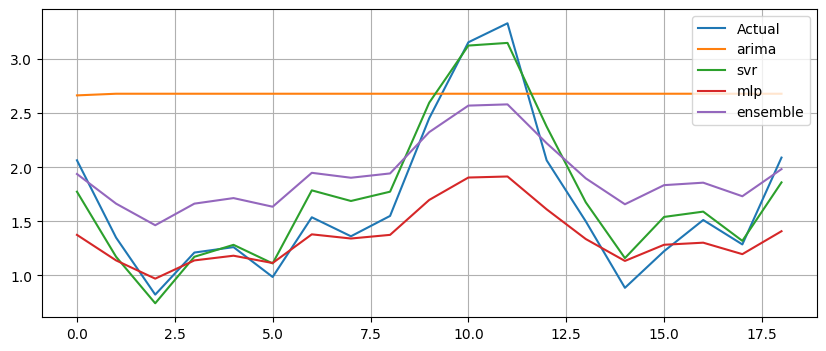

Generation 1: Fitness = 1.89390




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 2, 'd': 0, 'q': 2} Fitness: 2.0477742288355802
ArimaModel {'p': 3, 'd': 0, 'q': 2} Fitness: 1.079069201988996
ArimaModel {'p': 0, 'd': 1, 'q': 2} Fitness: 0.9187710307723447
ArimaModel {'p': 3, 'd': 0, 'q': 2} Fitness: 1.0649704891083436
ArimaModel {'p': 2, 'd': 1, 'q': 2} Fitness: 1.0412861885609481
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2471284538985934
ArimaModel {'p': 3, 'd': 0, 'q': 1} Fitness: 1.10214164866235
ArimaModel {'p': 1, 'd': 0, 'q': 1} Fitness: 2.0815590792920142
ArimaModel {'p': 3, 'd': 0, 'q': 2} Fitness: 1.9670386312192272
ArimaModel {'p': 2, 'd': 0, 'q': 2} Fitness: 1.0948224430533198
SVRModel {'kernel': 'poly', 'c': 12.496214869802339, 'gamma': 'scale', 'epsilon': 0.13547517844523843} Fitness: 1.937515851459924
SVRModel {'kernel': 'linear', 'c': 59.565693777511996, 'gamma': 'scale', 'epsilon': 0.14089427705687357} Fitness: 2.1324852148763394
SVRModel {'kernel': 'rbf', 'c': 21.506223073755987, 'gamma': 'scale', 'epsilon': 0.4664208646295798}

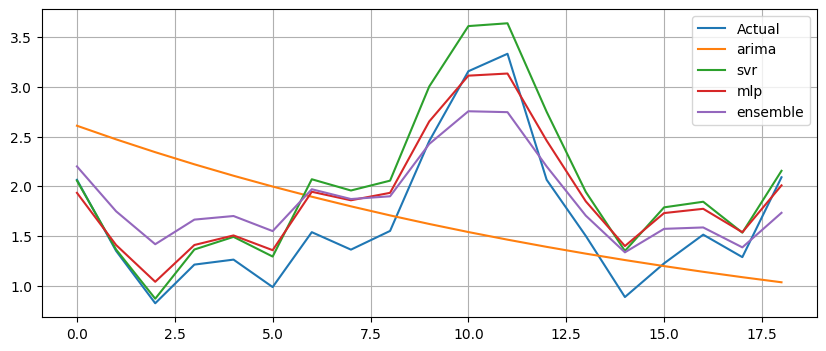

Generation 2: Fitness = 2.19532




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 3, 'd': 0, 'q': 2} Fitness: 1.0820155761203867
ArimaModel {'p': 3, 'd': 0, 'q': 1} Fitness: 1.0914425288057334
ArimaModel {'p': 2, 'd': 0, 'q': 2} Fitness: 1.1028845920028196
ArimaModel {'p': 3, 'd': 0, 'q': 2} Fitness: 1.0902803507901153
ArimaModel {'p': 1, 'd': 0, 'q': 1} Fitness: 1.092175079949914
ArimaModel {'p': 2, 'd': 0, 'q': 2} Fitness: 1.1029310820930125
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2286714597262176
ArimaModel {'p': 2, 'd': 0, 'q': 2} Fitness: 1.0868226327305714
ArimaModel {'p': 3, 'd': 0, 'q': 0} Fitness: 1.0839382206492287
ArimaModel {'p': 4, 'd': 0, 'q': 1} Fitness: 1.0830722608881984
SVRModel {'kernel': 'linear', 'c': 80.03901644067147, 'gamma': 'scale', 'epsilon': 0.19322163452350702} Fitness: 2.2764038665797335
SVRModel {'kernel': 'linear', 'c': 12.663112333734565, 'gamma': 'scale', 'epsilon': 0.14038093993920298} Fitness: 2.122528860630667
SVRModel {'kernel': 'linear', 'c': 84.64048901675183, 'gamma': 'scale', 'epsilon': 0.197803627649

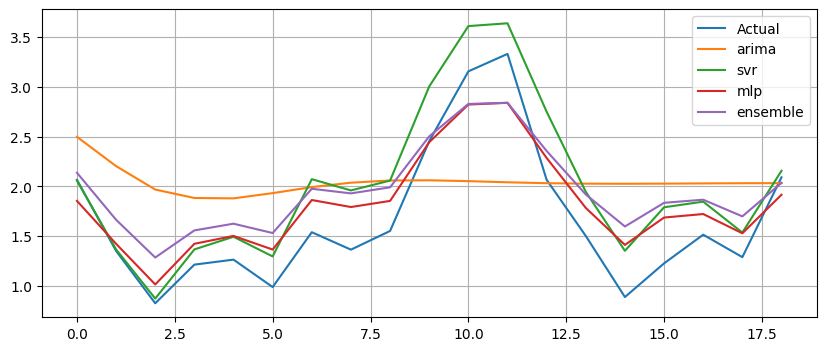

Generation 3: Fitness = 1.96734




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2328497083356953
ArimaModel {'p': 1, 'd': 1, 'q': 1} Fitness: 0.8139682898968756
ArimaModel {'p': 3, 'd': 0, 'q': 1} Fitness: 1.980314092035526
ArimaModel {'p': 1, 'd': 0, 'q': 1} Fitness: 1.1669603646132312
ArimaModel {'p': 3, 'd': 0, 'q': 1} Fitness: 1.0811332438769496
ArimaModel {'p': 2, 'd': 0, 'q': 2} Fitness: 1.0948224443529608
ArimaModel {'p': 1, 'd': 0, 'q': 1} Fitness: 1.084042379164496
ArimaModel {'p': 2, 'd': 0, 'q': 2} Fitness: 1.0855455696893566
ArimaModel {'p': 2, 'd': 0, 'q': 2} Fitness: 1.084220896277814
ArimaModel {'p': 2, 'd': 0, 'q': 2} Fitness: 1.0899180760399454
SVRModel {'kernel': 'linear', 'c': 84.64048901675183, 'gamma': 'scale', 'epsilon': 0.21453788936418083} Fitness: 2.3747811687429192
SVRModel {'kernel': 'linear', 'c': 83.99956132785422, 'gamma': 'scale', 'epsilon': 0.1945378958873775} Fitness: 2.2927071114525273
SVRModel {'kernel': 'poly', 'c': 80.67994412956908, 'gamma': 'scale', 'epsilon': 0.195277418627992} 

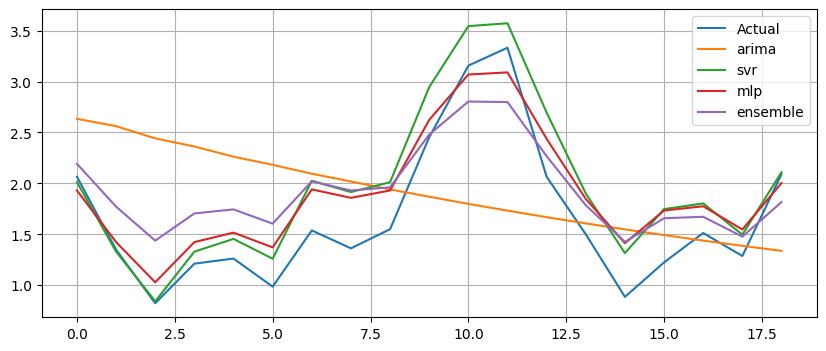

Generation 4: Fitness = 2.01895




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 0, 'q': 2} Fitness: 1.1017655949093648
ArimaModel {'p': 4, 'd': 0, 'q': 1} Fitness: 1.082973945544429
ArimaModel {'p': 2, 'd': 0, 'q': 2} Fitness: 1.0891479068908365
ArimaModel {'p': 2, 'd': 0, 'q': 2} Fitness: 1.0855691241866494
ArimaModel {'p': 3, 'd': 0, 'q': 1} Fitness: 1.0862335842081254
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2344266866331781
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2385451731868269
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2356743460136916
ArimaModel {'p': 3, 'd': 0, 'q': 2} Fitness: 1.0807005868457449
ArimaModel {'p': 2, 'd': 0, 'q': 1} Fitness: 1.0642845903034037
SVRModel {'kernel': 'linear', 'c': 84.64048901675183, 'gamma': 'scale', 'epsilon': 0.21453788936418083} Fitness: 2.3837052005766637
SVRModel {'kernel': 'linear', 'c': 84.64048901675183, 'gamma': 'scale', 'epsilon': 0.21453788936418083} Fitness: 2.3848680487700444
SVRModel {'kernel': 'linear', 'c': 81.13544065060326, 'gamma': 'scale', 'epsilon': 0.214537889364

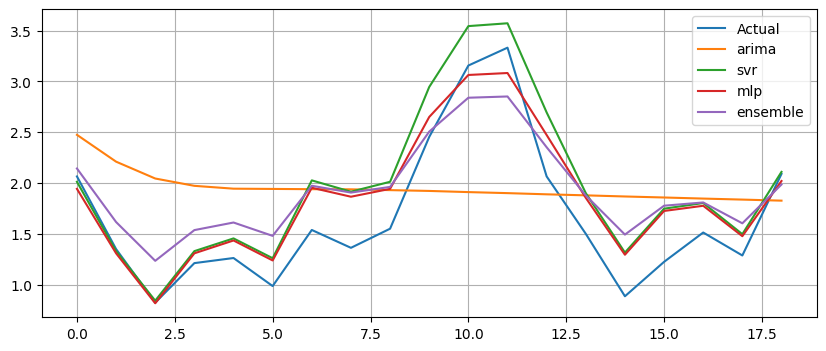

Generation 5: Fitness = 2.15225




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.232047714440779
ArimaModel {'p': 1, 'd': 0, 'q': 2} Fitness: 1.0484844270938376
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.1605725308930883
ArimaModel {'p': 4, 'd': 0, 'q': 1} Fitness: 1.0885448426474955
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2323191695663533
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2320526345602152
ArimaModel {'p': 2, 'd': 0, 'q': 2} Fitness: 1.092631450575234
ArimaModel {'p': 1, 'd': 0, 'q': 2} Fitness: 1.055294242877656
ArimaModel {'p': 2, 'd': 0, 'q': 2} Fitness: 1.088510712745283
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2406303921433537
SVRModel {'kernel': 'linear', 'c': 84.34449500885412, 'gamma': 'scale', 'epsilon': 0.23350843252898154} Fitness: 2.524794374721308
SVRModel {'kernel': 'linear', 'c': 83.99956132785422, 'gamma': 'scale', 'epsilon': 0.23350843252898154} Fitness: 2.533031180103922
SVRModel {'kernel': 'linear', 'c': 84.40862779157862, 'gamma': 'scale', 'epsilon': 0.22519114311644994

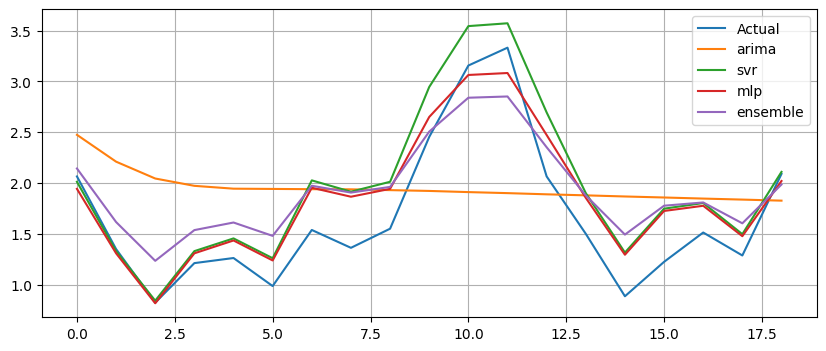

Generation 6: Fitness = 2.15225




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2568541679461065
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2356619937560565
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2387587889842524
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2385451723504761
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2519387869146155
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2511265874350026
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.26499792656978
ArimaModel {'p': 2, 'd': 0, 'q': 2} Fitness: 1.0994722878794452
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.165429820346036
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.165408231423326
SVRModel {'kernel': 'linear', 'c': 79.19987276350335, 'gamma': 'scale', 'epsilon': 0.23350843252898154} Fitness: 2.5215015301091617
SVRModel {'kernel': 'linear', 'c': 84.34449500885412, 'gamma': 'scale', 'epsilon': 0.23350843252898154} Fitness: 2.5219065908014997
SVRModel {'kernel': 'linear', 'c': 84.40862779157862, 'gamma': 'scale', 'epsilon': 0.233508432528981

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


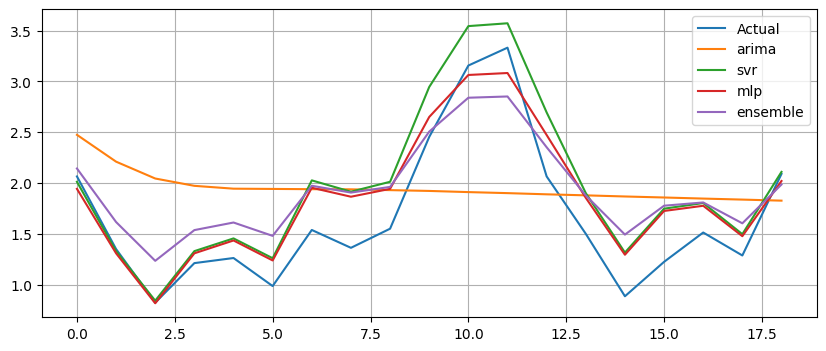

Generation 7: Fitness = 2.15225




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2385451723504761
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2207169931740984
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0852768307507088
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2438984809836242
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2385451735089288
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2385451731868269
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2385451725782755
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2272013865743472
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.238900784505875
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2379774072717276
SVRModel {'kernel': 'linear', 'c': 84.40862779157862, 'gamma': 'scale', 'epsilon': 0.23350843252898154} Fitness: 2.5219995104692816
SVRModel {'kernel': 'rbf', 'c': 84.34449500885412, 'gamma': 'scale', 'epsilon': 0.23350843252898154} Fitness: 1.4539140460393194
SVRModel {'kernel': 'linear', 'c': 84.3864875220526, 'gamma': 'scale', 'epsilon': 0.2335084325289815

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


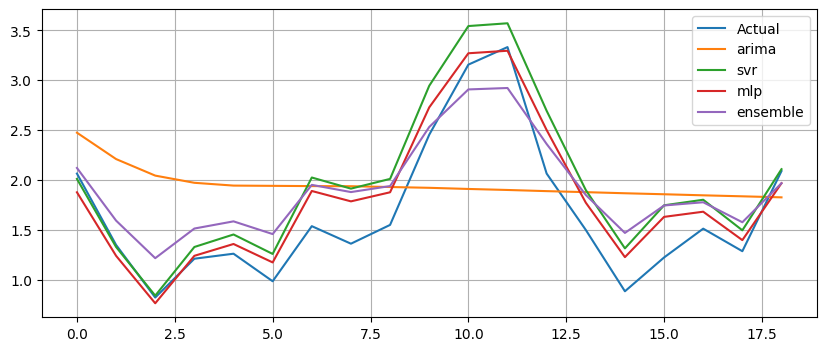

Generation 8: Fitness = 2.30060




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2358599751361552
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2384170739599332
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2385472244745765
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2386362168617757
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2385451723754672
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2385451723736254
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.235850329789854
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.238546732451054
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2395276195997902
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2385505481804473
SVRModel {'kernel': 'linear', 'c': 84.3905050563076, 'gamma': 'scale', 'epsilon': 0.23350843252898154} Fitness: 2.518188632486643
SVRModel {'kernel': 'linear', 'c': 84.40461025732363, 'gamma': 'scale', 'epsilon': 0.2463644570011202} Fitness: 2.6150171598288083
SVRModel {'kernel': 'linear', 'c': 84.40862779157862, 'gamma': 'scale', 'epsilon': 0.2335084325289815

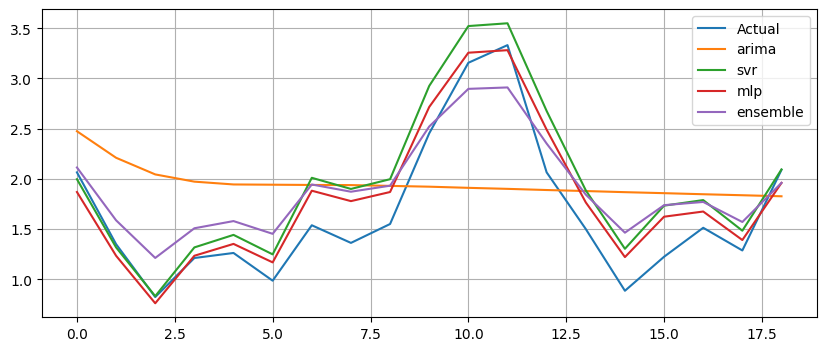

Generation 9: Fitness = 2.32667




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2390067955232509
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2385471327773268
ArimaModel {'p': 2, 'd': 0, 'q': 2} Fitness: 1.0924253907505845
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2438694407668998
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2216758560980407
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.246586875043752
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2393999600058387
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2446504896606765
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2382920383397245
ArimaModel {'p': 4, 'd': 1, 'q': 2} Fitness: 1.2313914092653242
SVRModel {'kernel': 'linear', 'c': 84.40132829588693, 'gamma': 'scale', 'epsilon': 0.23350843252898154} Fitness: 2.521597880801755
SVRModel {'kernel': 'linear', 'c': 84.40454673486185, 'gamma': 'scale', 'epsilon': 0.23350843252898154} Fitness: 2.5219968347954467
SVRModel {'kernel': 'linear', 'c': 84.40849835483971, 'gamma': 'scale', 'epsilon': 0.2463644570011

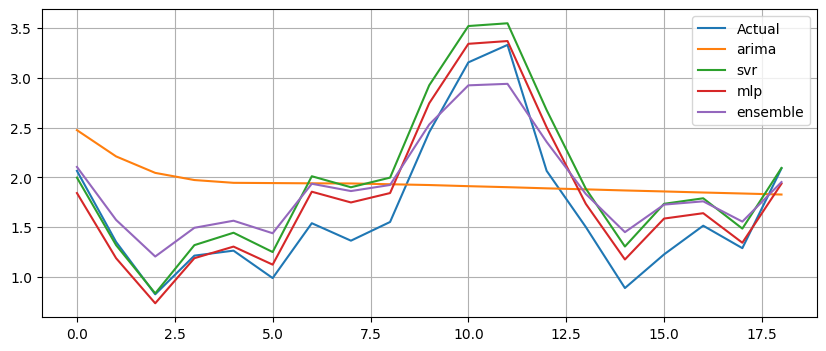

Generation 10: Fitness = 2.40982




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2436163067417396
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681361367550679
ArimaModel {'p': 4, 'd': 0, 'q': 1} Fitness: 1.0985680149482586
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.241889405419271
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.238292038339718
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.246586875043752
ArimaModel {'p': 0, 'd': 0, 'q': 2} Fitness: 0.9014831154938989
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2198160665685462
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2465880733863812
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2382830238746525
SVRModel {'kernel': 'linear', 'c': 84.40461025732363, 'gamma': 'scale', 'epsilon': 0.2463644570011202} Fitness: 2.614593815867021
SVRModel {'kernel': 'linear', 'c': 84.40699014363402, 'gamma': 'scale', 'epsilon': 0.2463644570011202} Fitness: 2.5953276947961683
SVRModel {'kernel': 'linear', 'c': 84.40849835483971, 'gamma': 'scale', 'epsilon': 0.2463644570011202} 

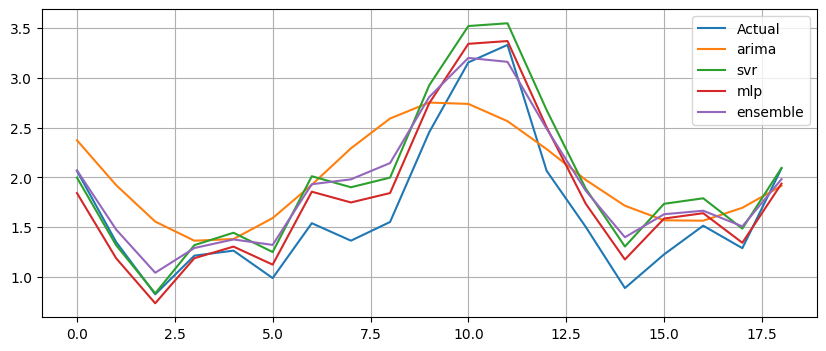

Generation 11: Fitness = 2.46280




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2390983677327443
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.677569520023649
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.246304557669999
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6813504758415492
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.246586875043752
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.246586875043749
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2467554161630185
ArimaModel {'p': 2, 'd': 0, 'q': 2} Fitness: 1.1006988150987518
ArimaModel {'p': 1, 'd': 0, 'q': 2} Fitness: 1.064775784595111
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2465880733863857
SVRModel {'kernel': 'linear', 'c': 84.40699014363402, 'gamma': 'scale', 'epsilon': 0.2463644570011202} Fitness: 2.6180374795228634
SVRModel {'kernel': 'linear', 'c': 84.40699014363402, 'gamma': 'scale', 'epsilon': 0.2463644570011202} Fitness: 2.598160311890443
SVRModel {'kernel': 'linear', 'c': 84.40699014363402, 'gamma': 'scale', 'epsilon': 0.2463644570011202} F

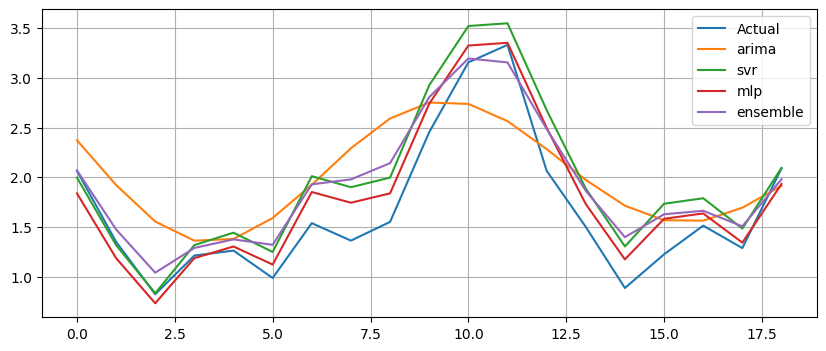

Generation 12: Fitness = 2.46666




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6814340200159223
ArimaModel {'p': 2, 'd': 0, 'q': 2} Fitness: 1.1004413885395572
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6814506108397376
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.246470143004876
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6813613676445238
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2463857874332274
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.900634966789661
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0943314801365305
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6813504758415487
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.246586875043752
SVRModel {'kernel': 'linear', 'c': 84.40849835483971, 'gamma': 'scale', 'epsilon': 0.2463644570011202} Fitness: 2.5955821346146446
SVRModel {'kernel': 'linear', 'c': 84.5747636834416, 'gamma': 'scale', 'epsilon': 0.2463644570011202} Fitness: 2.6292227905266286
SVRModel {'kernel': 'linear', 'c': 84.4069868502567, 'gamma': 'scale', 'epsilon': 0.2463644570011202} 

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


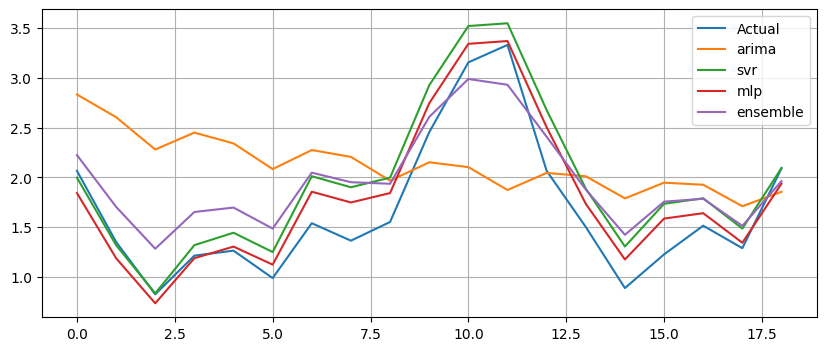

Generation 13: Fitness = 2.14039




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0925560938952126
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681552616958902
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0892206218387144
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.114652595376112
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0891800757421977
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.246586875043749
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6814645517700355
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0889010276663655
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0889382364851719
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815959689207056
SVRModel {'kernel': 'linear', 'c': 84.5747636834416, 'gamma': 'scale', 'epsilon': 0.2463644570011202} Fitness: 2.623143449410096
SVRModel {'kernel': 'linear', 'c': 84.5747636834416, 'gamma': 'scale', 'epsilon': 0.2463644570011202} Fitness: 2.5957404920217653
SVRModel {'kernel': 'linear', 'c': 84.40756805290863, 'gamma': 'scale', 'epsilon': 0.2463644570011202} F

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


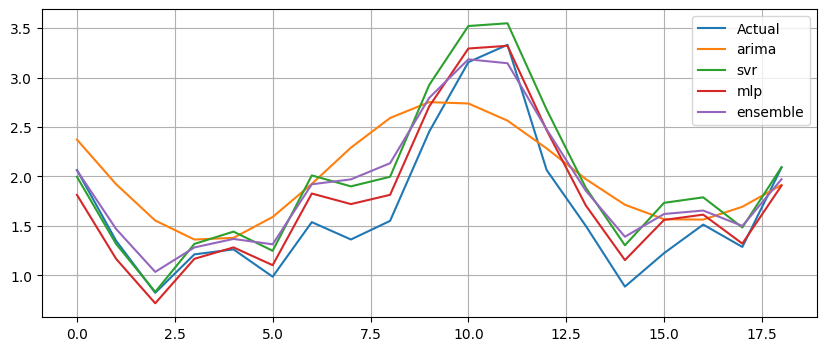

Generation 14: Fitness = 2.50949




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0891836843822664
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2464460435541431
ArimaModel {'p': 1, 'd': 0, 'q': 3} Fitness: 1.077133456222796
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6812857528539664
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815959689863793
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0940261397949045
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815959689863782
ArimaModel {'p': 2, 'd': 0, 'q': 4} Fitness: 1.2275582791769333
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815585461038463
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815916328052727
SVRModel {'kernel': 'linear', 'c': 84.40756805290863, 'gamma': 'scale', 'epsilon': 0.2463644570011202} Fitness: 2.6218228797798253
SVRModel {'kernel': 'linear', 'c': 84.40756805290863, 'gamma': 'scale', 'epsilon': 0.2463644570011202} Fitness: 2.615099090163932
SVRModel {'kernel': 'linear', 'c': 84.5747636834416, 'gamma': 'scale', 'epsilon': 0.2463644570011202

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


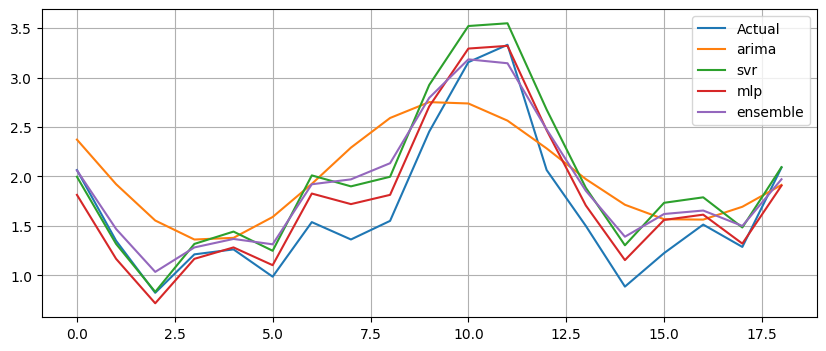

Generation 15: Fitness = 2.51002




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6813637667862014
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.3873892278758277
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.68159431214597
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2463842381841512
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815973690109374
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815973690002366
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6816606563737995
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6819248022067668
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815959689207056
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815959689863773
SVRModel {'kernel': 'linear', 'c': 84.40758713339251, 'gamma': 'scale', 'epsilon': 0.2463644570011202} Fitness: 2.5954134366835797
SVRModel {'kernel': 'poly', 'c': 84.40847927435583, 'gamma': 'scale', 'epsilon': 0.2463644570011202} Fitness: 1.5836789545738874
SVRModel {'kernel': 'linear', 'c': 84.53078851711463, 'gamma': 'scale', 'epsilon': 0.2463644570011202}

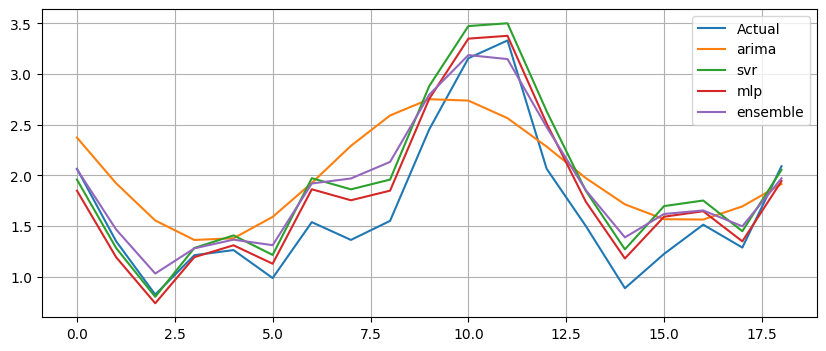

Generation 16: Fitness = 2.51792




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6812518771985214
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815937311113405
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6807266230596083
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815992853247712
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815920853005597
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815914962905176
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682027629757107
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.153366551980709
ArimaModel {'p': 1, 'd': 0, 'q': 3} Fitness: 1.0770033824358074
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815826058829875
SVRModel {'kernel': 'linear', 'c': 84.5166851843877, 'gamma': 'scale', 'epsilon': 0.2463644570011202} Fitness: 2.5952226157406475
SVRModel {'kernel': 'linear', 'c': 84.46564655196252, 'gamma': 'scale', 'epsilon': 0.2463644570011202} Fitness: 2.5957880958681305
SVRModel {'kernel': 'linear', 'c': 84.5747636834416, 'gamma': 'scale', 'epsilon': 0.2463644570011202}

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


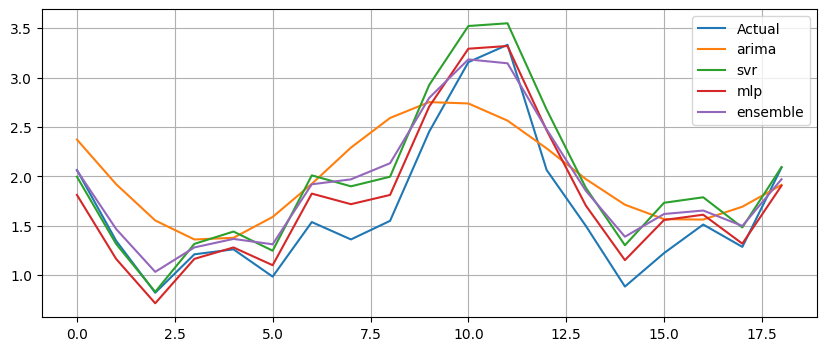

Generation 17: Fitness = 2.51190




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6816988371555677
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815432065477451
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815937311820672
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815914962948628
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815920852268802
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681592085232173
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.683509999812129
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815943121422388
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6816127350263594
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6816127349606877
SVRModel {'kernel': 'linear', 'c': 84.40756805290863, 'gamma': 'scale', 'epsilon': 0.2463644570011202} Fitness: 2.5959090592536067
SVRModel {'kernel': 'linear', 'c': 84.40756805290863, 'gamma': 'scale', 'epsilon': 0.2490073717985432} Fitness: 2.624889884596692
SVRModel {'kernel': 'linear', 'c': 84.41546307077319, 'gamma': 'scale', 'epsilon': 0.2463644570011202

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


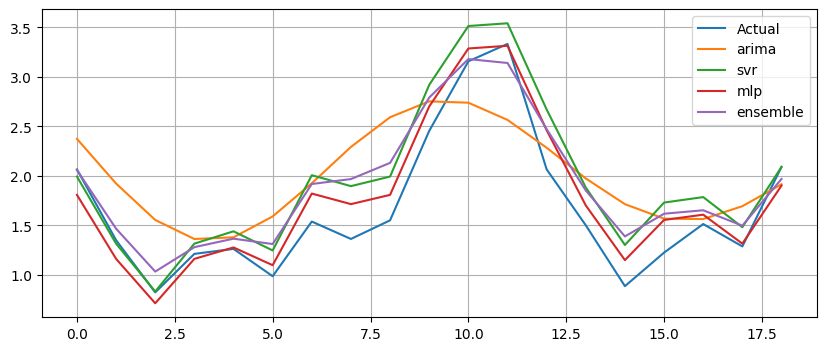

Generation 18: Fitness = 2.52817




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815435208556577
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6816124357113333
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681576260231325
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.1740448731277957
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815943121502361
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6833817409083298
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1534547350416922
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6816073758950416
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.9697754748879968
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6816127349606877
SVRModel {'kernel': 'linear', 'c': 84.40756805290863, 'gamma': 'scale', 'epsilon': 0.2490073717985432} Fitness: 2.62489121610913
SVRModel {'kernel': 'linear', 'c': 84.44709496809949, 'gamma': 'scale', 'epsilon': 0.2463644570011202} Fitness: 2.5958144891242174
SVRModel {'kernel': 'linear', 'c': 84.40756805290863, 'gamma': 'scale', 'epsilon': 0.2490073717985432

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


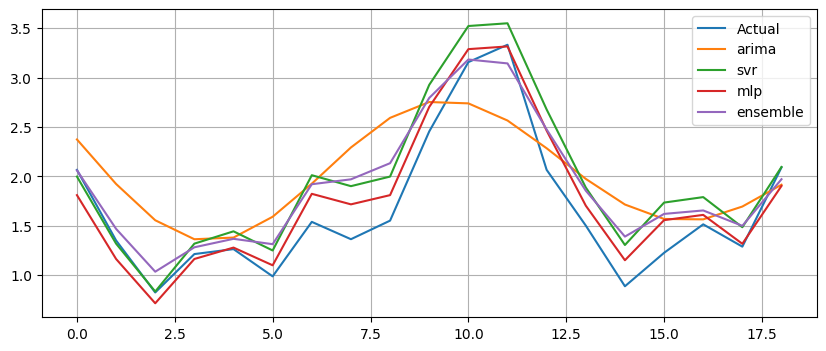

Generation 19: Fitness = 2.51932




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6816806694758912
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1706074053543427
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0941102386170414
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6816744057648465
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6816296278547842
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681595350782238
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6816195774411418
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6816195768464435
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6816341217043589
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815907031642536
SVRModel {'kernel': 'linear', 'c': 84.5747636834416, 'gamma': 'scale', 'epsilon': 0.24653260992797013} Fitness: 2.5977223245609964
SVRModel {'kernel': 'linear', 'c': 84.40756805290863, 'gamma': 'scale', 'epsilon': 0.24883921887169327} Fitness: 2.644870878068252
SVRModel {'kernel': 'linear', 'c': 84.5747636834416, 'gamma': 'scale', 'epsilon': 0.246364457001120

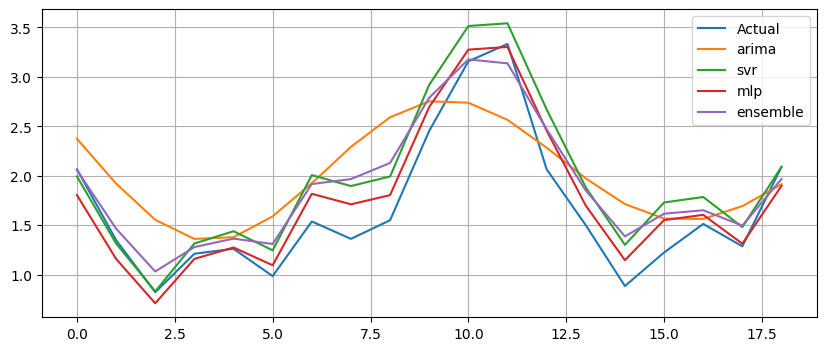

Generation 20: Fitness = 2.53246




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6811087911748317
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1534397048725098
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6816212053919386
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6813619246926743
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681623664136802
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6816195768464435
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.8945346452827276
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6816848943540057
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.17052614210879
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815714404192705
SVRModel {'kernel': 'linear', 'c': 77.19364196619877, 'gamma': 'scale', 'epsilon': 0.24854271022192215} Fitness: 2.6190448097978978
SVRModel {'kernel': 'linear', 'c': 84.513496479105, 'gamma': 'scale', 'epsilon': 0.24878459814167886} Fitness: 2.6397751298378327
SVRModel {'kernel': 'linear', 'c': 78.78788890272706, 'gamma': 'scale', 'epsilon': 0.2489161528357525

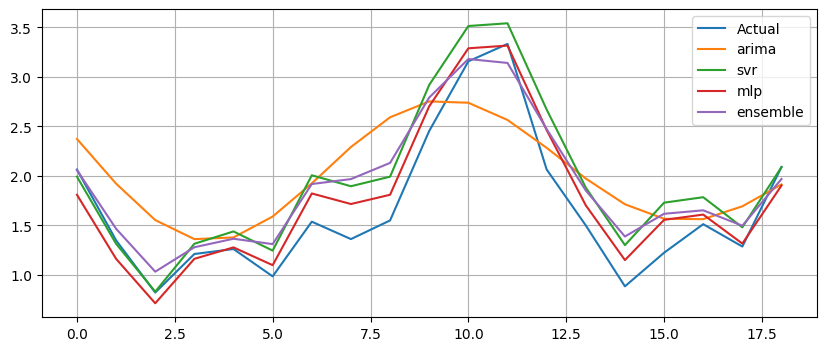

Generation 21: Fitness = 2.52417




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682077429564888
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.680979407623028
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815719977816788
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6809685171003272
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6757365796371286
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.174013475456729
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6816195771005553
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6816020658023008
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.173695415077254
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.8968994393843239
SVRModel {'kernel': 'rbf', 'c': 78.78788890272706, 'gamma': 'scale', 'epsilon': 0.2489240024917705} Fitness: 1.36181398318014
SVRModel {'kernel': 'linear', 'c': 84.4694045792252, 'gamma': 'scale', 'epsilon': 0.24899952214252521} Fitness: 2.6240680099562157
SVRModel {'kernel': 'linear', 'c': 82.30091601784206, 'gamma': 'scale', 'epsilon': 0.2490073717985432} Fitn

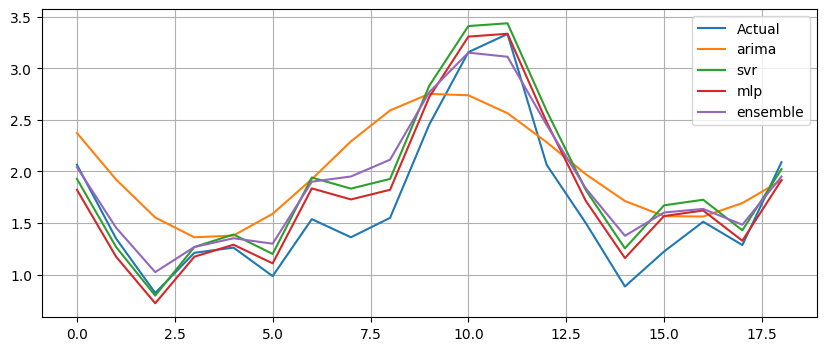

Generation 22: Fitness = 2.60982




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6825772937728432
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.1730080960200586
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6830843198487964
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821267027213251
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.67701804849654
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6814094100007522
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6870637797092958
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6763170594745669
ArimaModel {'p': 1, 'd': 0, 'q': 3} Fitness: 1.0768055047761205
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.1730179060393269
SVRModel {'kernel': 'linear', 'c': 82.8792078751159, 'gamma': 'scale', 'epsilon': 0.29917435734601483} Fitness: 3.0951945466450583
SVRModel {'kernel': 'linear', 'c': 82.8792078751159, 'gamma': 'scale', 'epsilon': 0.29917435734601483} Fitness: 3.114436238998884
SVRModel {'kernel': 'rbf', 'c': 82.8792078751159, 'gamma': 'scale', 'epsilon': 0.29917435734601483} F

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


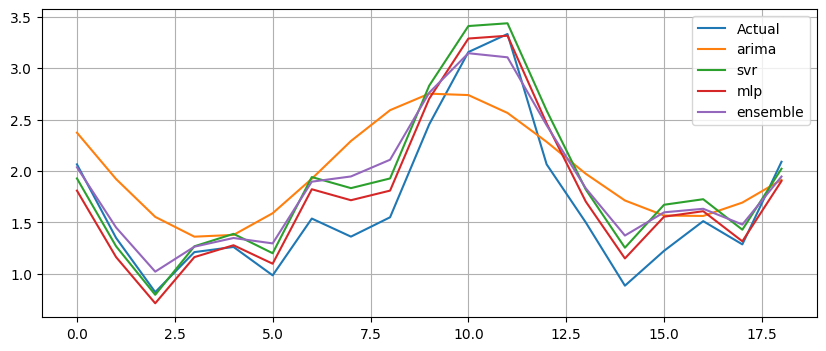

Generation 23: Fitness = 2.63405




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6811121047548119
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6853577254960208
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6806665074521836
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6814263441638573
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6809048140737497
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1534423977868316
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6814985240136455
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681753148205826
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681789444554731
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681460961803272
SVRModel {'kernel': 'linear', 'c': 79.03920570975191, 'gamma': 'scale', 'epsilon': 0.2884265265285578} Fitness: 2.9205454701768105
SVRModel {'kernel': 'linear', 'c': 79.86384566233642, 'gamma': 'scale', 'epsilon': 0.302415317619156} Fitness: 3.152970519225607
SVRModel {'kernel': 'linear', 'c': 82.8792078751159, 'gamma': 'scale', 'epsilon': 0.29917435734601483} 

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


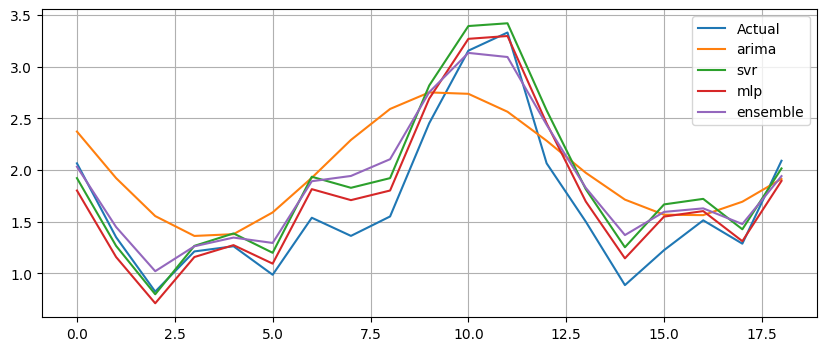

Generation 24: Fitness = 2.65659




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681474103312224
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6813578503967834
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.8805584890272402
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6814056096716479
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.680931508350093
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.679498172952325
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.2463436091870257
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6814263441638573
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6810093142048326
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6814072588248015
SVRModel {'kernel': 'linear', 'c': 80.91883697055795, 'gamma': 'scale', 'epsilon': 0.29917435734601483} Fitness: 3.093691417113817
SVRModel {'kernel': 'linear', 'c': 71.11775758219146, 'gamma': 'scale', 'epsilon': 0.302415317619156} Fitness: 3.1477573166696944
SVRModel {'kernel': 'linear', 'c': 79.86384566233642, 'gamma': 'scale', 'epsilon': 0.302415317619156} 

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


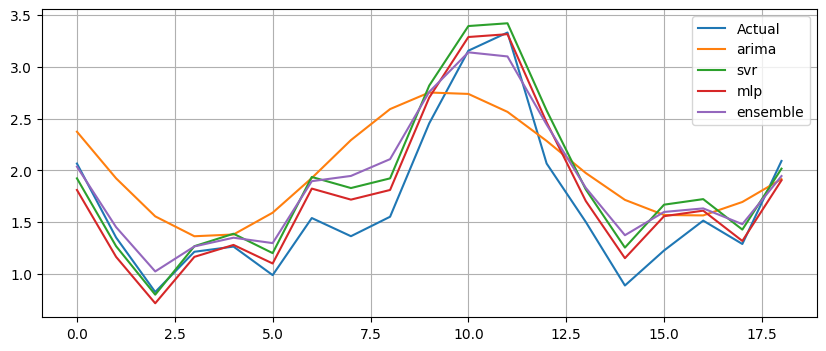

Generation 25: Fitness = 2.64389




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.1735444582655026
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6808995114527898
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2447636350571343
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6866862545598242
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681357850508641
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6814056096716479
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1537638801036636
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6812548596250145
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6774095823574018
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6813902322550618
SVRModel {'kernel': 'linear', 'c': 82.8792078751159, 'gamma': 'scale', 'epsilon': 0.29917435734601483} Fitness: 3.114245515712389
SVRModel {'kernel': 'linear', 'c': 79.86384566233642, 'gamma': 'scale', 'epsilon': 0.302415317619156} Fitness: 3.147414483889135
SVRModel {'kernel': 'linear', 'c': 78.98996666536539, 'gamma': 'scale', 'epsilon': 0.302415317619156} 

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


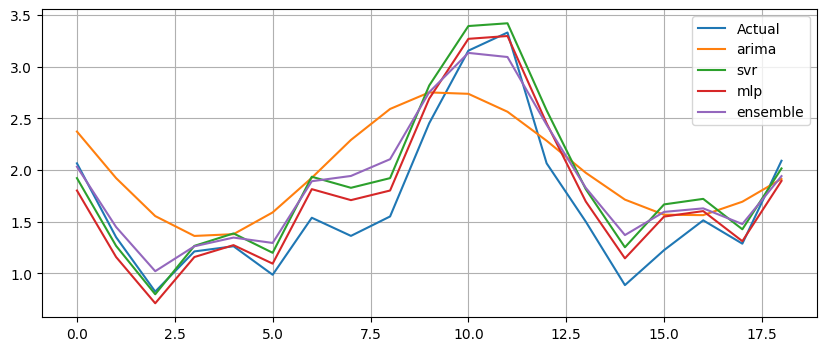

Generation 26: Fitness = 2.65659




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6814056096644512
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6814056096716479
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6814056096716479
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681304393877407
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6808995114527898
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6808995114933412
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6863898422024146
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6787236563391383
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6861543825058483
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6813578505014444
SVRModel {'kernel': 'linear', 'c': 78.98996666536539, 'gamma': 'scale', 'epsilon': 0.302415317619156} Fitness: 3.1478492469998383
SVRModel {'kernel': 'linear', 'c': 79.86384566233642, 'gamma': 'scale', 'epsilon': 0.302415317619156} Fitness: 3.147849385207808
SVRModel {'kernel': 'linear', 'c': 79.86384566233642, 'gamma': 'scale', 'epsilon': 0.302415317619156} 

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


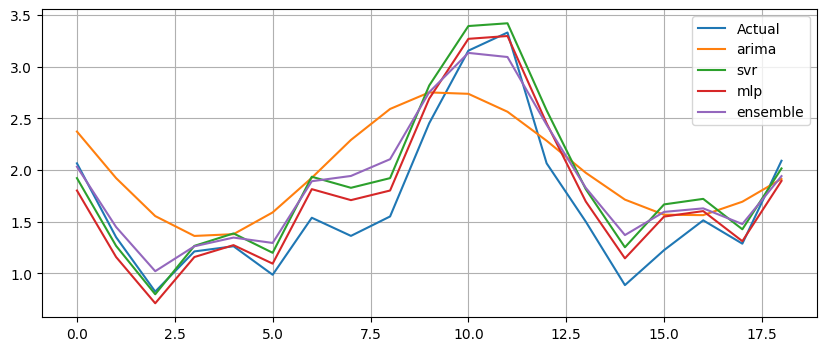

Generation 27: Fitness = 2.65659




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6813578505014444
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6814056096716479
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6814056096716479
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681779940346187
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6814056096716479
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6814056096716479
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6814056096644512
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6808995114527898
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1696082560316317
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6807683293196307
SVRModel {'kernel': 'linear', 'c': 78.98996666536539, 'gamma': 'scale', 'epsilon': 0.302415317619156} Fitness: 3.147758528813058
SVRModel {'kernel': 'linear', 'c': 79.86384566233642, 'gamma': 'scale', 'epsilon': 0.302415317619156} Fitness: 3.147849385207808
SVRModel {'kernel': 'linear', 'c': 79.86384566233642, 'gamma': 'scale', 'epsilon': 0.302415317619156} F

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


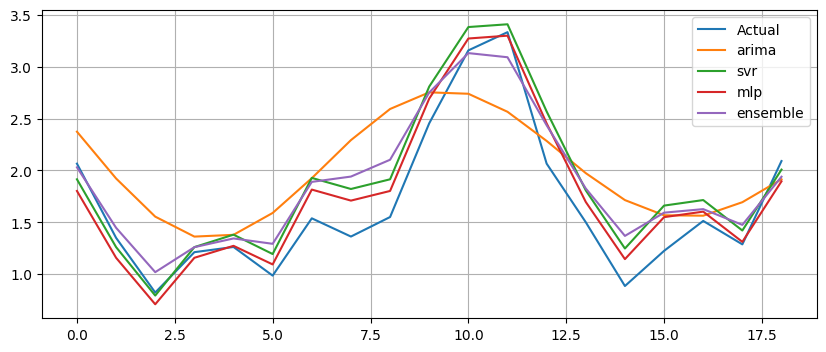

Generation 28: Fitness = 2.66941




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6814056096716479
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6814056096716479
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681357850508641
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681399790394704
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6814056096716479
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6811257753692335
ArimaModel {'p': 4, 'd': 0, 'q': 1} Fitness: 1.089409270334651
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681357850508641
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6813738890721657
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2446110668057326
SVRModel {'kernel': 'linear', 'c': 79.86384566233642, 'gamma': 'scale', 'epsilon': 0.302415317619156} Fitness: 3.147849385207808
SVRModel {'kernel': 'linear', 'c': 79.86384566233642, 'gamma': 'scale', 'epsilon': 0.302415317619156} Fitness: 3.147849385207808
SVRModel {'kernel': 'linear', 'c': 79.86384566233642, 'gamma': 'scale', 'epsilon': 0.302415317619156} Fitn

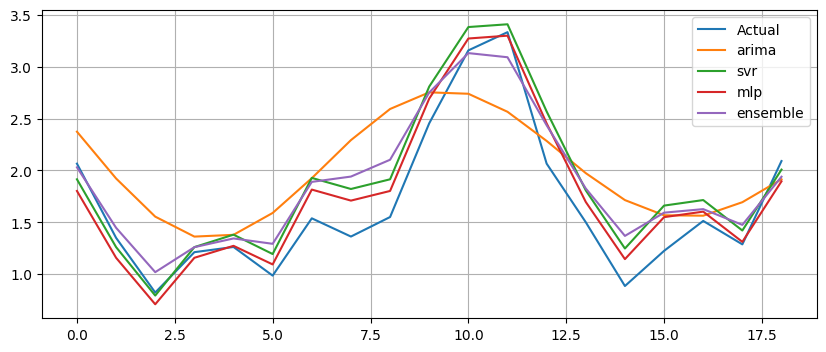

Generation 29: Fitness = 2.66941




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6814056096716479
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6813738890721657
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681399790394704
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681399790394704
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681373649887007
ArimaModel {'p': 1, 'd': 0, 'q': 3} Fitness: 1.7490298950207905
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6809313915046287
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6807987700258324
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6813692022307016
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6808490827495102
SVRModel {'kernel': 'linear', 'c': 79.86384566233642, 'gamma': 'scale', 'epsilon': 0.302415317619156} Fitness: 3.147849385207808
SVRModel {'kernel': 'linear', 'c': 79.86384566233642, 'gamma': 'scale', 'epsilon': 0.30579732642481067} Fitness: 3.195305600243575
SVRModel {'kernel': 'linear', 'c': 78.98996666536539, 'gamma': 'scale', 'epsilon': 0.30799026130304547}

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


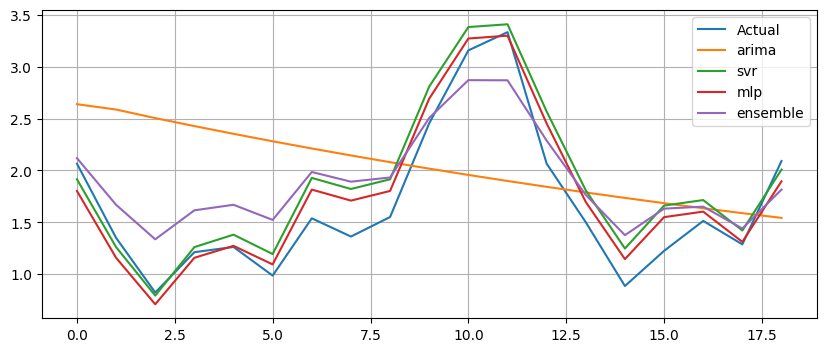

Generation 30: Fitness = 2.29139




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 1} Fitness: 1.0969140269407325
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6813997883318919
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6813873681197031
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6809892255162575
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 1.7888203145860713
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681399393275806
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6979790200325722
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.087234562199577
ArimaModel {'p': 1, 'd': 0, 'q': 3} Fitness: 1.0758464298123493
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.1729530583936905
SVRModel {'kernel': 'linear', 'c': 78.98996666536539, 'gamma': 'scale', 'epsilon': 0.30799026130304547} Fitness: 3.2416906322046577
SVRModel {'kernel': 'linear', 'c': 75.18533348937403, 'gamma': 'scale', 'epsilon': 0.30799026130304547} Fitness: 3.213195379108591
SVRModel {'kernel': 'linear', 'c': 68.61905760888955, 'gamma': 'scale', 'epsilon': 0.30694410124129

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


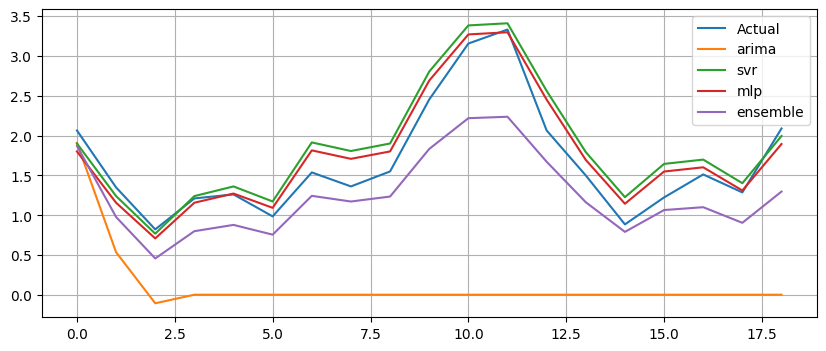

Generation 31: Fitness = 2.09577




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6813738867932324
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.68124008817192
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.8774716534657221
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.8774716394169432
ArimaModel {'p': 3, 'd': 0, 'q': 4} Fitness: 1.0513137586104746
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681812857655322
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681812857655322
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.8268342919154654
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6813781394414924
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.9607127055281643
SVRModel {'kernel': 'linear', 'c': 75.62018745302593, 'gamma': 'scale', 'epsilon': 0.30579732642481067} Fitness: 3.1953048205773285
SVRModel {'kernel': 'linear', 'c': 85.60923962081267, 'gamma': 'scale', 'epsilon': 0.3187866869210998} Fitness: 3.3025839836212185
SVRModel {'kernel': 'linear', 'c': 75.18533348937403, 'gamma': 'scale', 'epsilon': 0.3079902613030454

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


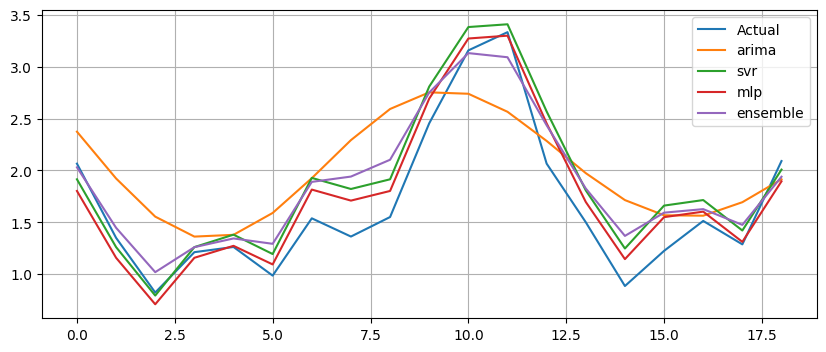

Generation 32: Fitness = 2.66941




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681812857655322
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815163542516198
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6759498867052094
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6813738890721657
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0889573998391542
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6813997883318919
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6813997883318919
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6813997883318919
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6810773145976696
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681399790394704
SVRModel {'kernel': 'linear', 'c': 78.98996666536539, 'gamma': 'scale', 'epsilon': 0.3528495639762632} Fitness: 3.3079102351962426
SVRModel {'kernel': 'linear', 'c': 78.98996666536539, 'gamma': 'scale', 'epsilon': 0.3528495639762632} Fitness: 3.307725499381975
SVRModel {'kernel': 'linear', 'c': 75.18533348937403, 'gamma': 'scale', 'epsilon': 0.3079902613030454

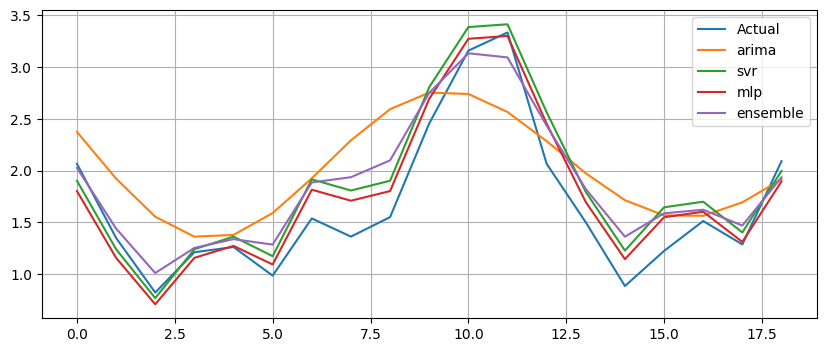

Generation 33: Fitness = 2.70081




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128554315126
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6831574542507814
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.2467696126786554
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6813997883318919
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681812857655322
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681619607773451
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6813997890636883
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1532398989120076
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128572041613
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6813997883318919
SVRModel {'kernel': 'linear', 'c': 66.41189949909791, 'gamma': 'scale', 'epsilon': 0.3528495639762632} Fitness: 3.3079137939033556
SVRModel {'kernel': 'rbf', 'c': 78.88814001634648, 'gamma': 'scale', 'epsilon': 0.30799026130304547} Fitness: 1.444268141906504
SVRModel {'kernel': 'poly', 'c': 75.18533348937403, 'gamma': 'scale', 'epsilon': 0.30799026130304547} F

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


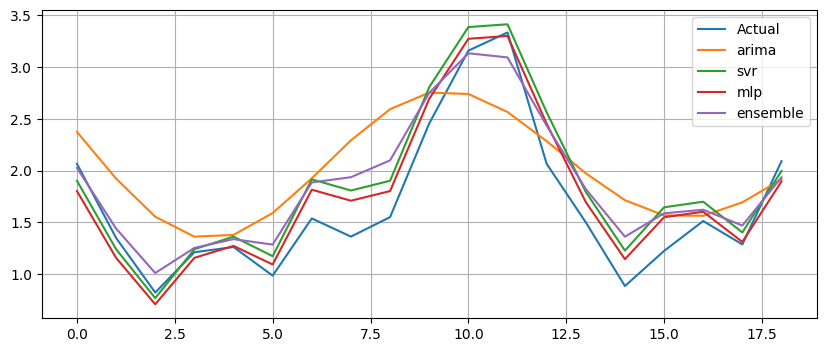

Generation 34: Fitness = 2.70081




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681812857244081
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681379865944523
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6850095915857752
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128554315126
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681812857655322
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128574168636
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128554315126
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815432957978702
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.170379342510319
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128572041613
SVRModel {'kernel': 'linear', 'c': 76.66347928158031, 'gamma': 'scale', 'epsilon': 0.3528495639762632} Fitness: 3.3079108937006874
SVRModel {'kernel': 'linear', 'c': 78.76336681962141, 'gamma': 'scale', 'epsilon': 0.3528495639762632} Fitness: 3.307614520648955
SVRModel {'kernel': 'rbf', 'c': 78.98996666536539, 'gamma': 'scale', 'epsilon': 0.3528495639762632} Fit

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


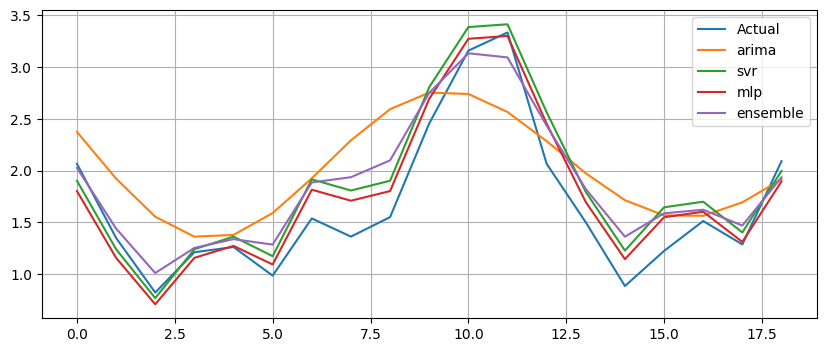

Generation 35: Fitness = 2.70081




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128572041613
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128554315126
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128600842022
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128554315126
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128554315126
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1546865509320126
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128572041613
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1546865491970213
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.2592282837336994
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.1737626713571876
SVRModel {'kernel': 'linear', 'c': 76.43687943583633, 'gamma': 'scale', 'epsilon': 0.3528495639762632} Fitness: 3.3079109582765707
SVRModel {'kernel': 'linear', 'c': 66.41189949909791, 'gamma': 'scale', 'epsilon': 0.3528495639762632} Fitness: 3.3079137939033556
SVRModel {'kernel': 'linear', 'c': 92.72613213434354, 'gamma': 'scale', 'epsilon': 0.3528495639762

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


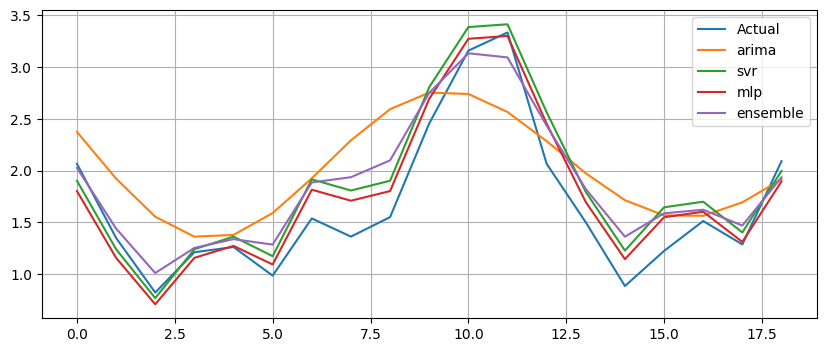

Generation 36: Fitness = 2.70081




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.684967076541557
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.677421697942265
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681812856889746
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.093864911797786
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128554315126
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128572041613
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128572041613
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6812736000731134
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128577611322
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128572041613
SVRModel {'kernel': 'rbf', 'c': 75.72212267412682, 'gamma': 'scale', 'epsilon': 0.3528495639762632} Fitness: 1.474947370230398
SVRModel {'kernel': 'linear', 'c': 67.12665626080742, 'gamma': 'scale', 'epsilon': 0.3528495639762632} Fitness: 3.3085813617216093
SVRModel {'kernel': 'linear', 'c': 74.65723410862867, 'gamma': 'scale', 'epsilon': 0.3528495639762632} Fit

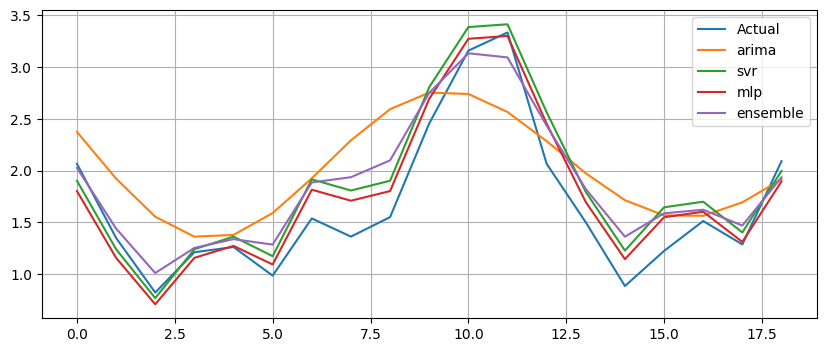

Generation 37: Fitness = 2.70081




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128555582181
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681773690967669
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128557461896
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128557461896
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6814925216597938
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128565562844
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128555582181
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2525275948676489
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128557461896
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128554315126
SVRModel {'kernel': 'linear', 'c': 67.12665626080742, 'gamma': 'scale', 'epsilon': 0.3528495639762632} Fitness: 3.3079135927631587
SVRModel {'kernel': 'linear', 'c': 67.12665626080742, 'gamma': 'scale', 'epsilon': 0.2801379624390379} Fitness: 2.840108589205386
SVRModel {'kernel': 'linear', 'c': 68.19154482630557, 'gamma': 'scale', 'epsilon': 0.352849563976263

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


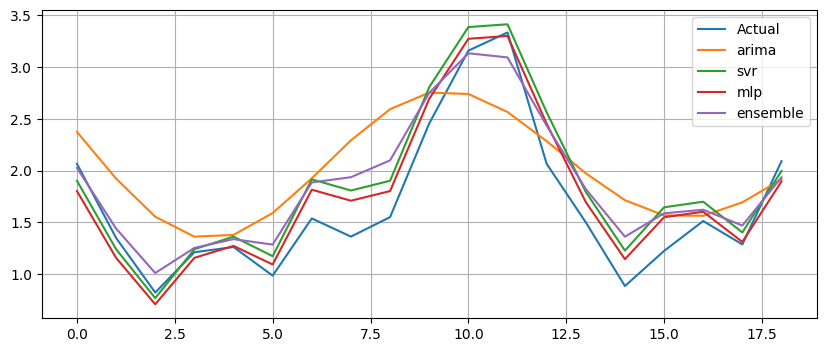

Generation 38: Fitness = 2.70081




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128557461896
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128557461896
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128557461896
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128557461896
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128557216525
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681812855582757
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128557461896
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128568927269
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128556785288
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128555001035
SVRModel {'kernel': 'linear', 'c': 68.19154482630557, 'gamma': 'scale', 'epsilon': 0.3528495639762632} Fitness: 3.307913290503217
SVRModel {'kernel': 'linear', 'c': 68.19154482630557, 'gamma': 'scale', 'epsilon': 0.3528495639762632} Fitness: 3.307913290503217
SVRModel {'kernel': 'linear', 'c': 68.19154482630557, 'gamma': 'scale', 'epsilon': 0.3528495639762632

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


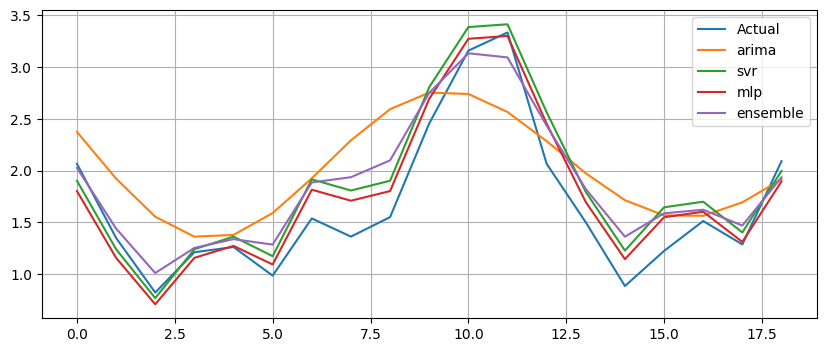

Generation 39: Fitness = 2.70081




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128557216525
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6787319028688807
ArimaModel {'p': 1, 'd': 0, 'q': 3} Fitness: 1.0767171868274412
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128557216525
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681621831505625
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128555884935
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128556354068
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128555865959
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6811796579105864
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681648441414267
SVRModel {'kernel': 'linear', 'c': 68.05307261551906, 'gamma': 'scale', 'epsilon': 0.3528495639762632} Fitness: 3.3079133295014893
SVRModel {'kernel': 'linear', 'c': 66.79803020939666, 'gamma': 'scale', 'epsilon': 0.3528495639762632} Fitness: 3.307665169177436
SVRModel {'kernel': 'linear', 'c': 63.94396517980667, 'gamma': 'scale', 'epsilon': 0.3528495639762632

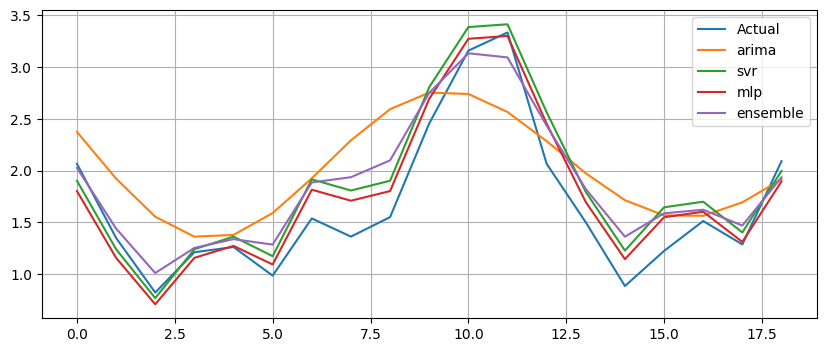

Generation 40: Fitness = 2.70081




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6816181261084668
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128549952236
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128549952236
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128555884935
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128557342051
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128563346537
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128555884935
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128555865959
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128549952236
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6816852344731756
SVRModel {'kernel': 'linear', 'c': 63.94396517980667, 'gamma': 'scale', 'epsilon': 0.3528495639762632} Fitness: 3.307762693100589
SVRModel {'kernel': 'linear', 'c': 63.94396517980667, 'gamma': 'scale', 'epsilon': 0.3528495639762632} Fitness: 3.30791449228296
SVRModel {'kernel': 'linear', 'c': 63.94396517980667, 'gamma': 'scale', 'epsilon': 0.3528495639762632

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


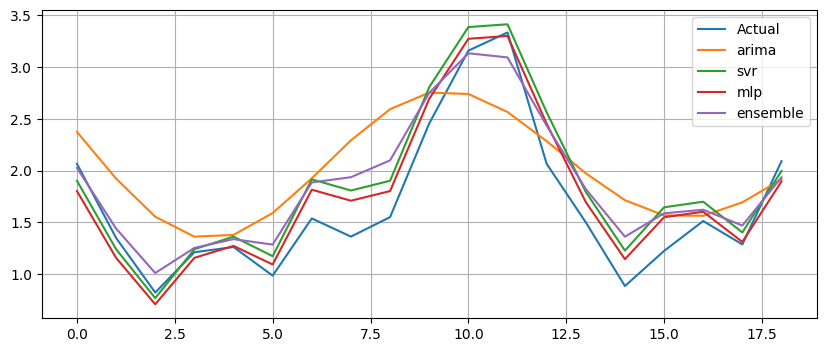

Generation 41: Fitness = 2.70081




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1703793334901595
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128549952236
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128558750434
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128549952236
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128549952236
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.2612363225459364
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681918208837848
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681812854252395
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.144957035918781
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6811290828947576
SVRModel {'kernel': 'linear', 'c': 63.94396517980667, 'gamma': 'scale', 'epsilon': 0.3528495639762632} Fitness: 3.329376227585899
SVRModel {'kernel': 'linear', 'c': 63.94396517980667, 'gamma': 'scale', 'epsilon': 0.3528495639762632} Fitness: 3.30791449228296
SVRModel {'kernel': 'linear', 'c': 68.91949423429992, 'gamma': 'scale', 'epsilon': 0.3528495639762632} F

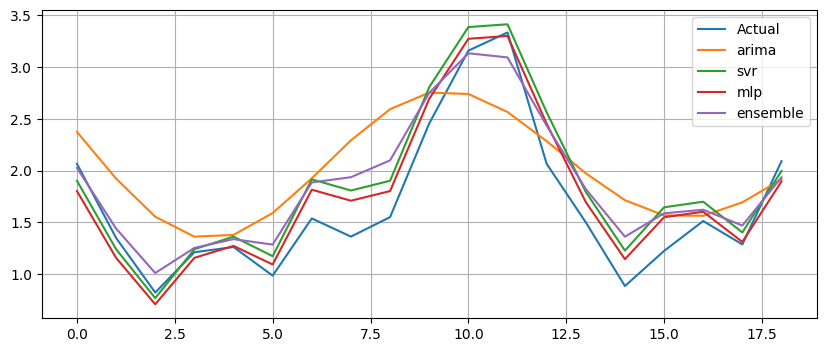

Generation 42: Fitness = 2.70081




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681812854252395
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2452907286573989
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818098026157773
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.680628726944229
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128556093472
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128549952236
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128549952236
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128549952236
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681812854252395
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681812854252395
SVRModel {'kernel': 'linear', 'c': 59.73955384560653, 'gamma': 'scale', 'epsilon': 0.3528495639762632} Fitness: 3.3079156834811667
SVRModel {'kernel': 'linear', 'c': 63.94396517980667, 'gamma': 'scale', 'epsilon': 0.3528495639762632} Fitness: 3.326235646883078
SVRModel {'kernel': 'linear', 'c': 64.2867410064599, 'gamma': 'scale', 'epsilon': 0.3528495639762632} F

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


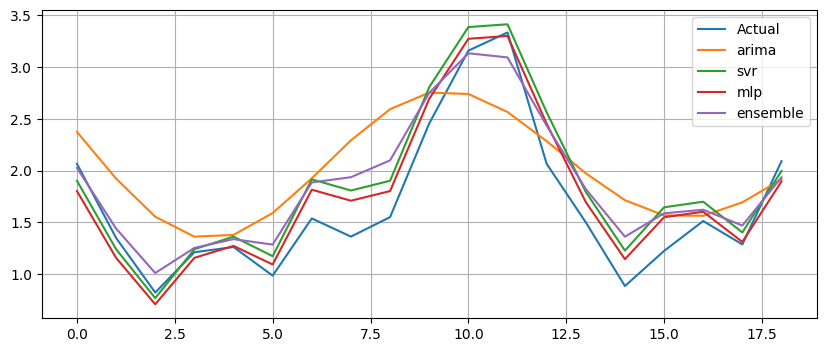

Generation 43: Fitness = 2.70081




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681812854252395
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6873112577123002
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681812854252395
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128549952236
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815045834400983
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6816304315505508
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128549952236
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815337137660806
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681812854252395
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128549952236
SVRModel {'kernel': 'linear', 'c': 59.73955384560653, 'gamma': 'scale', 'epsilon': 0.3528495639762632} Fitness: 3.3079156834811667
SVRModel {'kernel': 'linear', 'c': 63.94396517980667, 'gamma': 'scale', 'epsilon': 0.3528495639762632} Fitness: 3.3127950515854345
SVRModel {'kernel': 'linear', 'c': 59.73955384560653, 'gamma': 'scale', 'epsilon': 0.3528495639762632

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


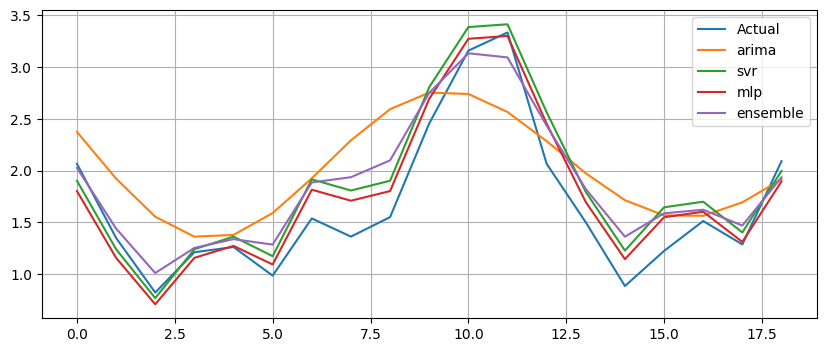

Generation 44: Fitness = 2.70081




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681812854252395
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681812854252395
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681812854252395
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128549952236
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6819069855489643
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128546904485
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.8520491078361627
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128549542202
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681812854252395
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.1736773621950845
SVRModel {'kernel': 'linear', 'c': 59.73955384560653, 'gamma': 'scale', 'epsilon': 0.3528495639762632} Fitness: 3.3079156834811667
SVRModel {'kernel': 'linear', 'c': 59.73955384560653, 'gamma': 'scale', 'epsilon': 0.3528495639762632} Fitness: 3.3079156834811667
SVRModel {'kernel': 'linear', 'c': 59.73955384560653, 'gamma': 'scale', 'epsilon': 0.3528495639762632}

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


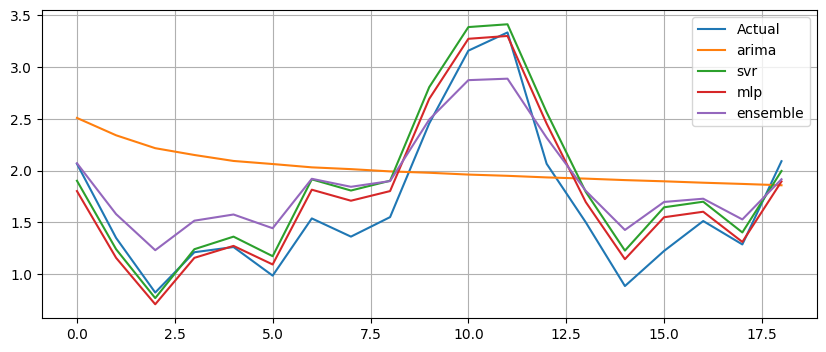

Generation 45: Fitness = 2.43411




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128542708244
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6813944284085252
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.17376265893755
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.17376265893755
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2452907247709026
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681812854252395
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128549952236
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6812962088862478
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681812854252395
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.173762662065706
SVRModel {'kernel': 'linear', 'c': 59.84497108821259, 'gamma': 'scale', 'epsilon': 0.3528495639762632} Fitness: 3.3079156529810585
SVRModel {'kernel': 'linear', 'c': 63.83854793720061, 'gamma': 'scale', 'epsilon': 0.3528495639762632} Fitness: 3.307651637265796
SVRModel {'kernel': 'linear', 'c': 59.73955384560653, 'gamma': 'scale', 'epsilon': 0.3528495639762632} Fit

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


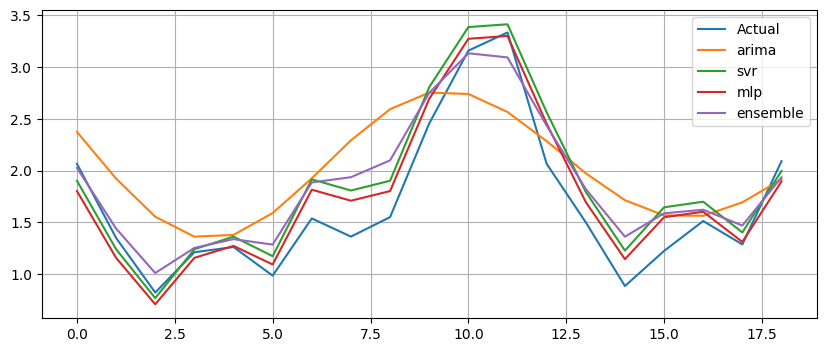

Generation 46: Fitness = 2.70081




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815679314188636
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6812011478402746
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.1737626569255046
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.259316321540422
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681812854252395
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6806287253821586
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681812854252395
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1538714653674456
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6790882236285352
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128544597821
SVRModel {'kernel': 'linear', 'c': 63.94396517980667, 'gamma': 'scale', 'epsilon': 0.3528495639762632} Fitness: 3.30776021923511
SVRModel {'kernel': 'linear', 'c': 63.94396517980667, 'gamma': 'scale', 'epsilon': 0.3528495639762632} Fitness: 3.307592863671278
SVRModel {'kernel': 'linear', 'c': 57.03459251666307, 'gamma': 'scale', 'epsilon': 0.3528495639762632} F

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


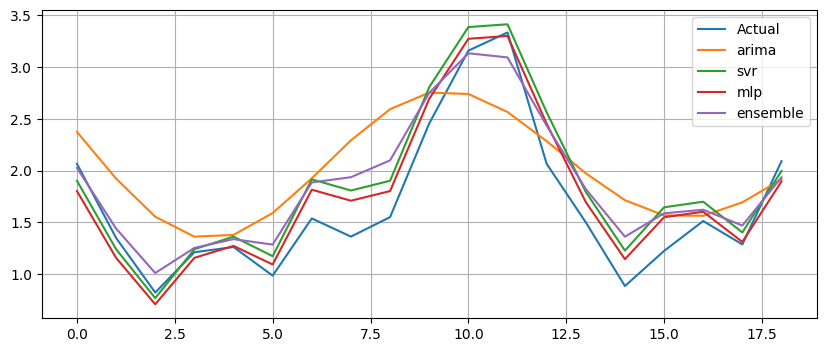

Generation 47: Fitness = 2.70081




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128547876703
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128537742476
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681812854252395
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128537742476
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681632133680664
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128537742476
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.676417648196848
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128540211983
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681812854252395
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6984182249332351
SVRModel {'kernel': 'linear', 'c': 62.77005847214642, 'gamma': 'scale', 'epsilon': 0.3528495639762632} Fitness: 3.307914824393945
SVRModel {'kernel': 'linear', 'c': 57.03459251666307, 'gamma': 'scale', 'epsilon': 0.3528495639762632} Fitness: 3.307916449075873
SVRModel {'kernel': 'linear', 'c': 59.73955384560653, 'gamma': 'scale', 'epsilon': 0.3528495639762632} F

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


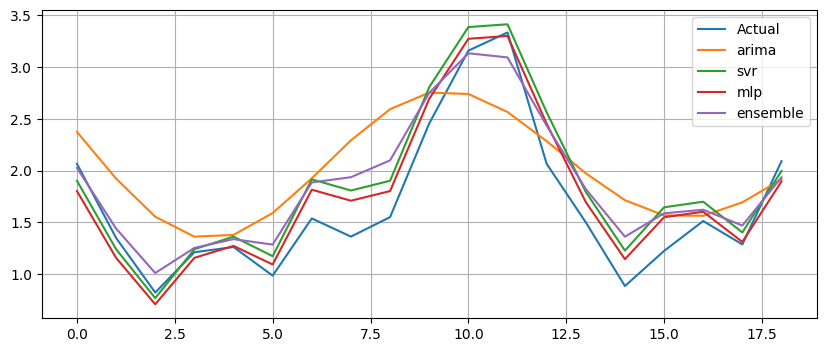

Generation 48: Fitness = 2.70081




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128537742476
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0898657964171445
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128547876703
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128547876703
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128545027282
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128540592412
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.1737626611926024
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.8478719853067231
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681481956128914
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.683721219306508
SVRModel {'kernel': 'linear', 'c': 57.03459251666307, 'gamma': 'scale', 'epsilon': 0.3528495639762632} Fitness: 3.307916449075873
SVRModel {'kernel': 'linear', 'c': 57.03459251666307, 'gamma': 'scale', 'epsilon': 0.3528495639762632} Fitness: 3.3344182314183053
SVRModel {'kernel': 'linear', 'c': 62.77005847214642, 'gamma': 'scale', 'epsilon': 0.3528495639762632

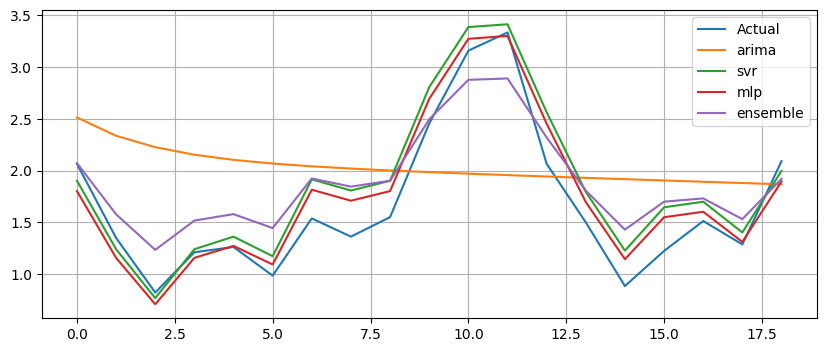

Generation 49: Fitness = 2.42408




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.8478643794344864
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2429210161692816
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128537742476
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.089347598474357
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6814534558487593
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681812853790143
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1703793296644
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128537742476
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128537742476
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1703793389614454
SVRModel {'kernel': 'poly', 'c': 58.646834368163766, 'gamma': 'scale', 'epsilon': 0.3528495639762632} Fitness: 1.4920183534082034
SVRModel {'kernel': 'linear', 'c': 62.77005847214642, 'gamma': 'scale', 'epsilon': 0.46469404134818243} Fitness: 4.471968106186139
SVRModel {'kernel': 'linear', 'c': 57.03459251666307, 'gamma': 'scale', 'epsilon': 0.3528495639762632} F

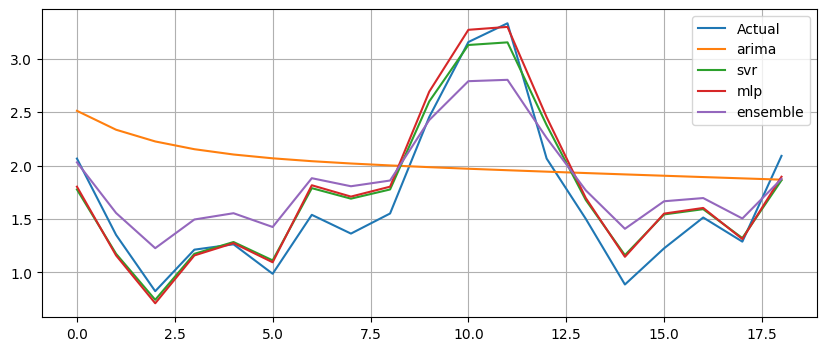

Generation 50: Fitness = 2.49626




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1700606972364311
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128548535212
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1553641793636353
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128540592412
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128554450642
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1703793362759491
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.8511646869002161
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818128547876703
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.686915359975306
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1704870180183695
SVRModel {'kernel': 'linear', 'c': 57.03459251666307, 'gamma': 'scale', 'epsilon': 0.3335630513427497} Fitness: 3.4505088038459184
SVRModel {'kernel': 'linear', 'c': 63.142895781140155, 'gamma': 'scale', 'epsilon': 0.3528495639762632} Fitness: 3.307914718693903
SVRModel {'kernel': 'linear', 'c': 59.480948043260625, 'gamma': 'scale', 'epsilon': 0.4646940413481

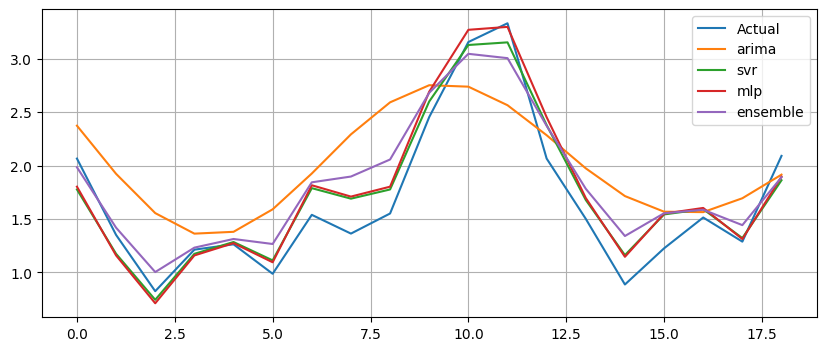

Generation 51: Fitness = 2.89056




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6810433414623807
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821789436168066
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681810962749116
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822719637305052
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6826038373241656
ArimaModel {'p': 4, 'd': 0, 'q': 1} Fitness: 1.0954593569240698
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681775599539058
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822273521449531
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6820038921399156
SVRModel {'kernel': 'linear', 'c': 61.26817670381237, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.530459690089423
SVRModel {'kernel': 'linear', 'c': 60.14871613649781, 'gamma': 'scale', 'epsilon': 0.46469404134818243} Fitness: 4.4564779109695
SVRModel {'kernel': 'linear', 'c': 66.7261233292826, 'gamma': 'scale', 'epsilon': 0.36310190402618614} Fitness: 3.13569

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


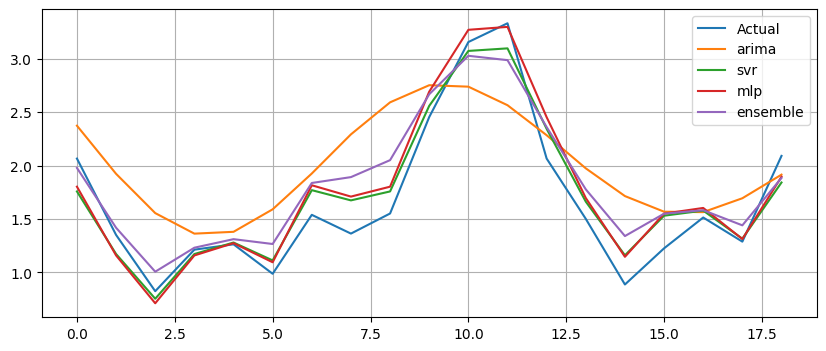

Generation 52: Fitness = 2.90442




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6810431399342098
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.692251673752341
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822454846891388
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.686584695809787
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2421532160393534
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822273521449531
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682101280142171
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6819055131583587
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822273521449531
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
SVRModel {'kernel': 'linear', 'c': 60.90736999210546, 'gamma': 'scale', 'epsilon': 0.49720067844124777} Fitness: 4.527109292841743
SVRModel {'kernel': 'rbf', 'c': 60.0567050091005, 'gamma': 'scale', 'epsilon': 0.4980871567791691} Fitness: 1.5109647045339387
SVRModel {'kernel': 'linear', 'c': 62.77005847214642, 'gamma': 'scale', 'epsilon': 0.46987846495590885} Fi

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


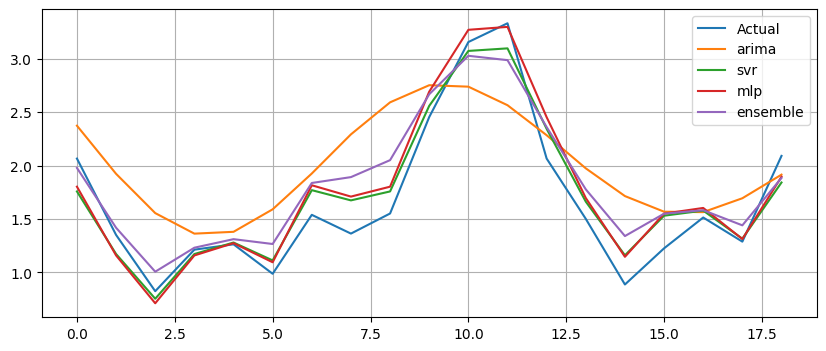

Generation 53: Fitness = 2.90442




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822273373308168
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822273899321163
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227419542826
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.123648504712938
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822273109841128
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822273538720458
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2423036180382359
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274308401859
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.678400912029996
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.171552964076436
SVRModel {'kernel': 'linear', 'c': 59.88277346047188, 'gamma': 'scale', 'epsilon': 0.4954595574632013} Fitness: 4.523083905855936
SVRModel {'kernel': 'linear', 'c': 60.03223761150426, 'gamma': 'scale', 'epsilon': 0.4993560189290723} Fitness: 4.527969689103603
SVRModel {'kernel': 'linear', 'c': 61.26817670381237, 'gamma': 'scale', 'epsilon': 0.4996127187168358} F

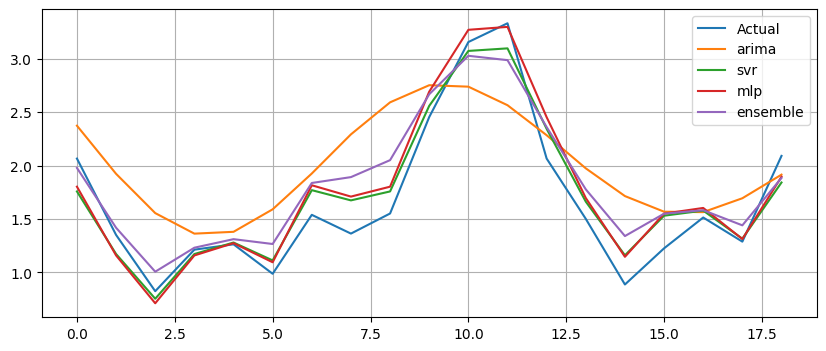

Generation 54: Fitness = 2.90442




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227461896169
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682229505330136
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6819838004336007
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.1723409648701952
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6820466264157958
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822272715115354
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.0915407099331425
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822272884738987
SVRModel {'kernel': 'linear', 'c': 61.26817670381237, 'gamma': 'scale', 'epsilon': 0.4999393738715094} Fitness: 4.528629677383226
SVRModel {'kernel': 'linear', 'c': 61.26817670381237, 'gamma': 'scale', 'epsilon': 0.48758255666612865} Fitness: 4.510698422765312
SVRModel {'kernel': 'linear', 'c': 60.44489668225199, 'gamma': 'scale', 'epsilon': 0.49528783522041686}

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


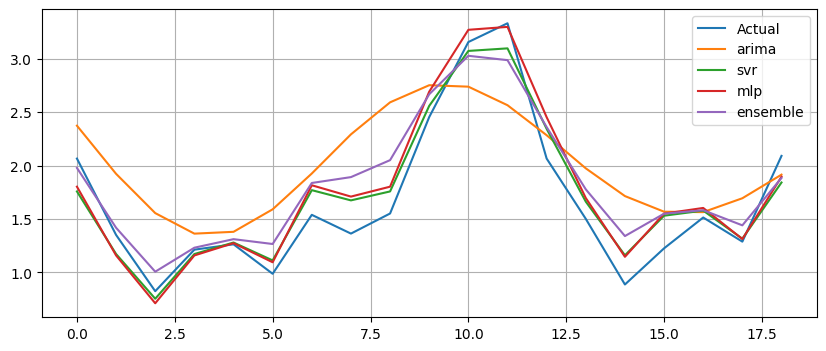

Generation 55: Fitness = 2.90442




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822272690711852
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822272690711852
ArimaModel {'p': 1, 'd': 0, 'q': 3} Fitness: 1.0742583662747642
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.113233089076167
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822272690711852
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822272746706324
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.128888654166789
SVRModel {'kernel': 'linear', 'c': 59.8198475921165, 'gamma': 'scale', 'epsilon': 0.49725712265961786} Fitness: 4.525440851813811
SVRModel {'kernel': 'linear', 'c': 59.8198475921165, 'gamma': 'scale', 'epsilon': 0.49725712265961786} Fitness: 4.525440851813811
SVRModel {'kernel': 'linear', 'c': 59.830688108756675, 'gamma': 'scale', 'epsilon': 0.49909943098387893} 

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


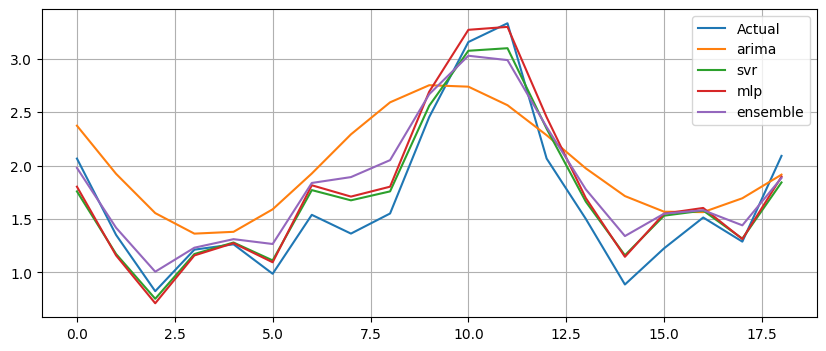

Generation 56: Fitness = 2.90410




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822273447343439
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6819466026393817
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1682048173012616
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822273091323243
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227302063678
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822273097629614
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6877258730496933
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2421655073178919
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681919211397853
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815087120245573
SVRModel {'kernel': 'linear', 'c': 60.519178318953976, 'gamma': 'scale', 'epsilon': 0.49889346008569346} Fitness: 4.527433095857836
SVRModel {'kernel': 'linear', 'c': 61.26817670381237, 'gamma': 'scale', 'epsilon': 0.4987328970334744} Fitness: 4.527422648070597
SVRModel {'kernel': 'linear', 'c': 60.859383626255735, 'gamma': 'scale', 'epsilon': 0.49884040909510

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


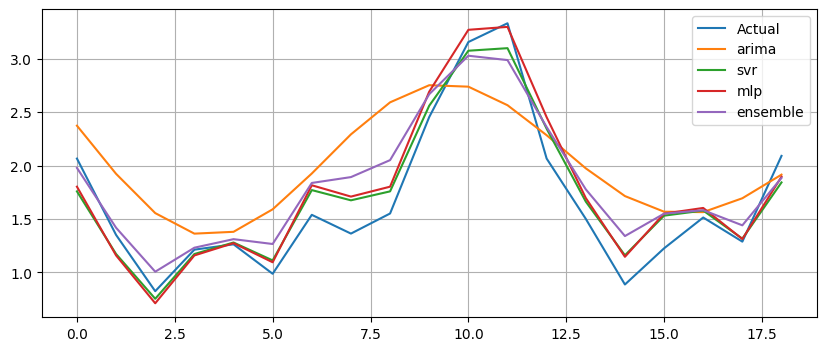

Generation 57: Fitness = 2.90400




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274231129908
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822273733635442
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822273402214174
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.69037470328273
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822273402214174
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822273402214174
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6795027772979452
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6903918185864486
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822273594860977
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822273438461444
SVRModel {'kernel': 'linear', 'c': 61.26338443514865, 'gamma': 'scale', 'epsilon': 0.49964189570768625} Fitness: 4.528295454407751
SVRModel {'kernel': 'linear', 'c': 60.864175894919455, 'gamma': 'scale', 'epsilon': 0.49919851338741844} Fitness: 4.527788291274783
SVRModel {'kernel': 'linear', 'c': 60.859383626255735, 'gamma': 'scale', 'epsilon': 0.4988404090951

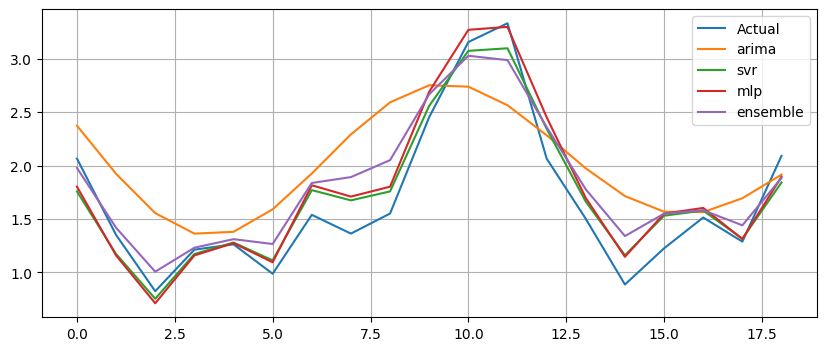

Generation 58: Fitness = 2.90425




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6810432942427544
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822273402214174
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274231129908
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822273438461444
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274084570803
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274231129908
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822273402214174
ArimaModel {'p': 1, 'd': 0, 'q': 3} Fitness: 1.0742472312495768
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822273733635442
SVRModel {'kernel': 'linear', 'c': 61.26338443514865, 'gamma': 'scale', 'epsilon': 0.49964189570768625} Fitness: 4.530055041835483
SVRModel {'kernel': 'linear', 'c': 58.823397954711815, 'gamma': 'scale', 'epsilon': 0.49884040909510463} Fitness: 4.5273708042182585
SVRModel {'kernel': 'linear', 'c': 61.13029929500727, 'gamma': 'scale', 'epsilon': 0.499641895707

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


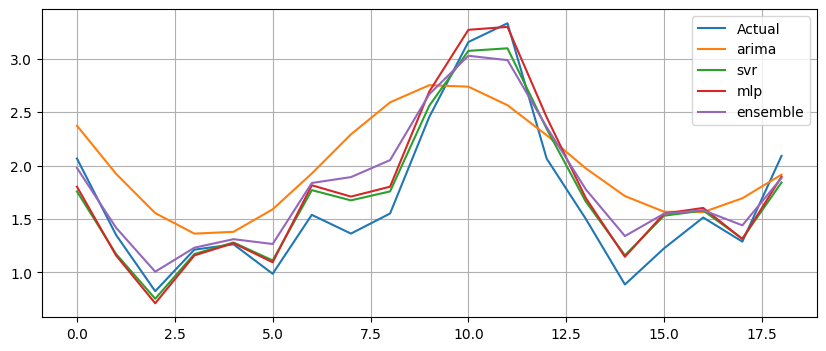

Generation 59: Fitness = 2.90430




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274231129908
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274231129908
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1550903696491215
ArimaModel {'p': 4, 'd': 0, 'q': 1} Fitness: 1.094643083208872
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274231129908
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274231129908
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274231129908
ArimaModel {'p': 1, 'd': 0, 'q': 3} Fitness: 1.0742472312495768
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274231129908
SVRModel {'kernel': 'linear', 'c': 61.18172619648793, 'gamma': 'scale', 'epsilon': 0.49964189570768625} Fitness: 4.528295454407751
SVRModel {'kernel': 'linear', 'c': 61.211957533667984, 'gamma': 'scale', 'epsilon': 0.49964189570768625} Fitness: 4.528295454407751
SVRModel {'kernel': 'linear', 'c': 61.26338443514865, 'gamma': 'scale', 'epsilon': 0.49964189570768

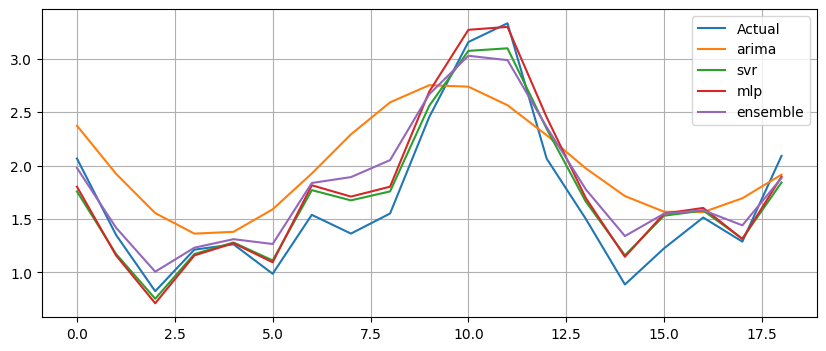

Generation 60: Fitness = 2.90430




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274231129908
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274231129908
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274231129908
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274231129908
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274231129908
ArimaModel {'p': 1, 'd': 0, 'q': 3} Fitness: 1.0742472312495768
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1440645642638894
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6778362654970373
SVRModel {'kernel': 'linear', 'c': 61.26338443514865, 'gamma': 'scale', 'epsilon': 0.49964189570768625} Fitness: 4.528295454407751
SVRModel {'kernel': 'linear', 'c': 61.26338443514865, 'gamma': 'scale', 'epsilon': 0.49964189570768625} Fitness: 4.528295454407751
SVRModel {'kernel': 'linear', 'c': 61.26338443514865, 'gamma': 'scale', 'epsilon': 0.499641895707686

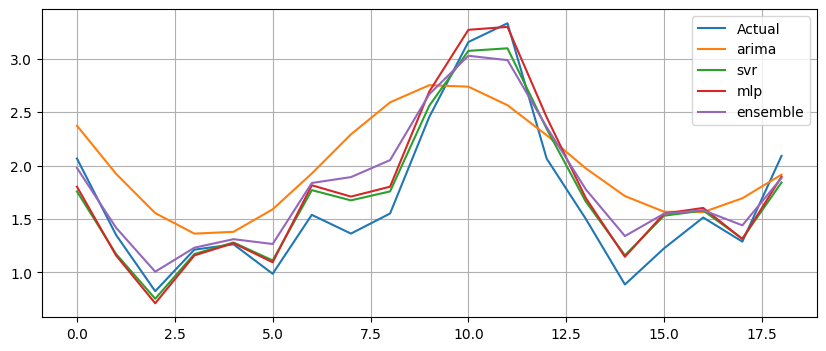

Generation 61: Fitness = 2.90430




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274231129908
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2370913465664135
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6795027919538557
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274231129908
ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0889048535041173
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274231129908
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.1118368444806226
SVRModel {'kernel': 'linear', 'c': 61.26338443514865, 'gamma': 'scale', 'epsilon': 0.49964189570768625} Fitness: 4.528295454407751
SVRModel {'kernel': 'linear', 'c': 61.26338443514865, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528697196009063
SVRModel {'kernel': 'linear', 'c': 61.26338443514865, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528697196009063
SV

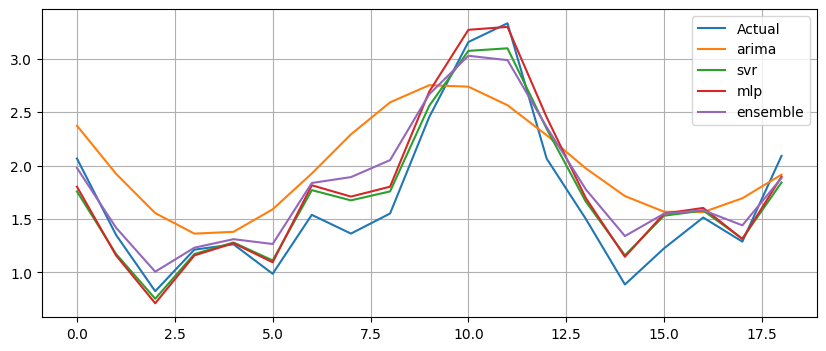

Generation 62: Fitness = 2.90430




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274547465994
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6767775357135422
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274231129908
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682063008781068
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274231129908
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815436510125246
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274231129908
SVRModel {'kernel': 'linear', 'c': 61.26338443514865, 'gamma': 'scale', 'epsilon': 0.4998869511030397} Fitness: 4.528571131996343
SVRModel {'kernel': 'linear', 'c': 61.26338443514865, 'gamma': 'scale', 'epsilon': 0.4997549446046466} Fitness: 4.533408540946787
SVRModel {'kernel': 'linear', 'c': 48.400995847147584, 'gamma': 'scale', 'epsilon': 0.49964189570768625}

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


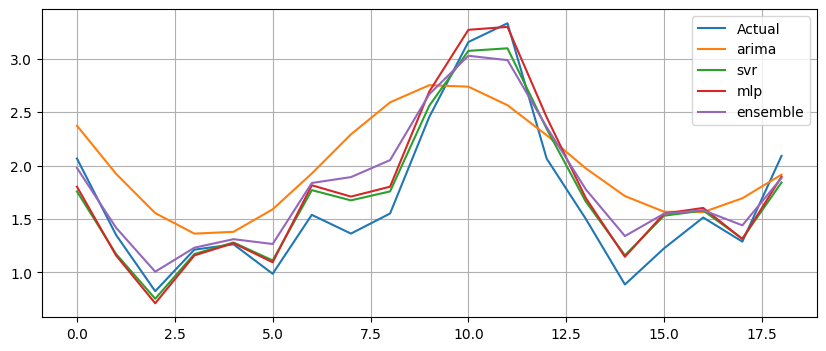

Generation 63: Fitness = 2.90430




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274373402246
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6786837931996452
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274231129908
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274373402246
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274373402246
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.1714644967098193
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.687725856856086
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6768322321113451
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274245119386
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821831123952111
SVRModel {'kernel': 'linear', 'c': 61.26338443514865, 'gamma': 'scale', 'epsilon': 0.4997549446046466} Fitness: 4.528423039582875
SVRModel {'kernel': 'linear', 'c': 61.26338443514865, 'gamma': 'scale', 'epsilon': 0.4997549446046466} Fitness: 4.531754356047457
SVRModel {'kernel': 'linear', 'c': 61.26338443514865, 'gamma': 'scale', 'epsilon': 0.4996418957076862

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


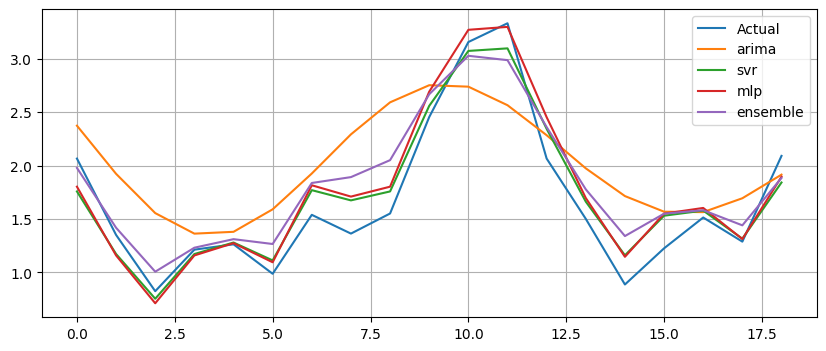

Generation 64: Fitness = 2.90442




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274379196651
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 1, 'd': 0, 'q': 3} Fitness: 1.0700425431738843
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274373402246
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274379196651
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274541390096
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6817188375278516
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681734144769759
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274541390096
SVRModel {'kernel': 'linear', 'c': 54.71970619538496, 'gamma': 'scale', 'epsilon': 0.4997594457052029} Fitness: 4.528428104929885
SVRModel {'kernel': 'linear', 'c': 54.325737831576426, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528697196009063
SVRModel {'kernel': 'rbf', 'c': 56.06185453591809, 'gamma': 'scale', 'epsilon': 0.4998824500024833} Fitness: 1.508304

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


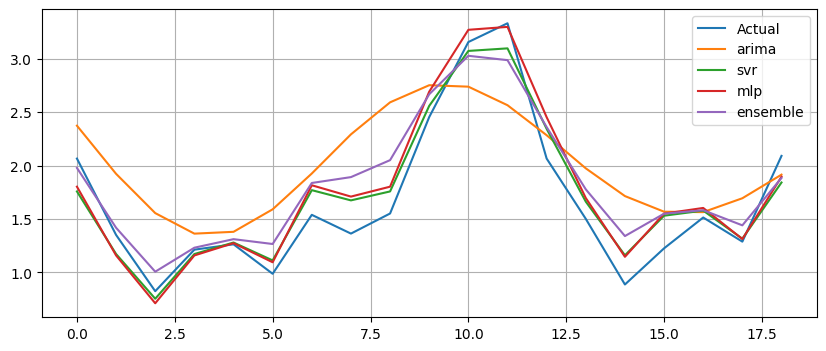

Generation 65: Fitness = 2.90442




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274379196651
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.171468986557131
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274379196651
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274379196651
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274379196651
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682578201098256
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274379196651
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.1108329977080116
SVRModel {'kernel': 'linear', 'c': 54.325737831576426, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528697196009063
SVRModel {'kernel': 'linear', 'c': 53.60252574637814, 'gamma': 'scale', 'epsilon': 0.4997594457052029} Fitness: 4.528428104929885
SVRModel {'kernel': 'linear', 'c': 53.60252574637814, 'gamma': 'scale', 'epsilon': 0.4997594457052029} Fitness: 4.5471

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


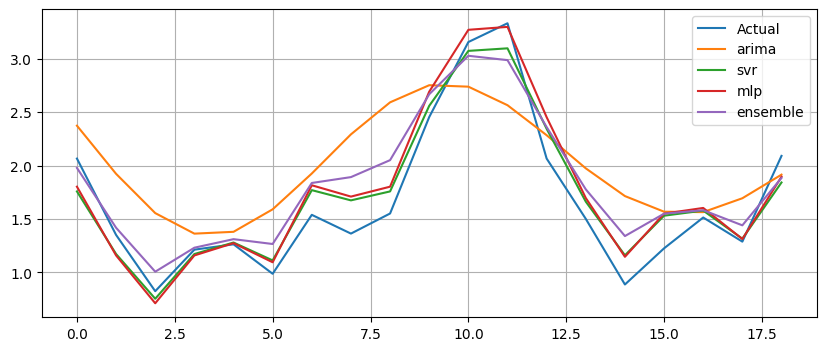

Generation 66: Fitness = 2.90434




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274379196651
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274379196651
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274379196651
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.171468986557131
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274379196651
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6786838261920376
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227451112211
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274564497572
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274465011928
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6783684799616754
SVRModel {'kernel': 'linear', 'c': 53.60252574637814, 'gamma': 'scale', 'epsilon': 0.4997594457052029} Fitness: 4.528428104929885
SVRModel {'kernel': 'linear', 'c': 53.60252574637814, 'gamma': 'scale', 'epsilon': 0.4997594457052029} Fitness: 4.528428104929885
SVRModel {'kernel': 'linear', 'c': 53.60252574637814, 'gamma': 'scale', 'epsilon': 0.4997594457052029}

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


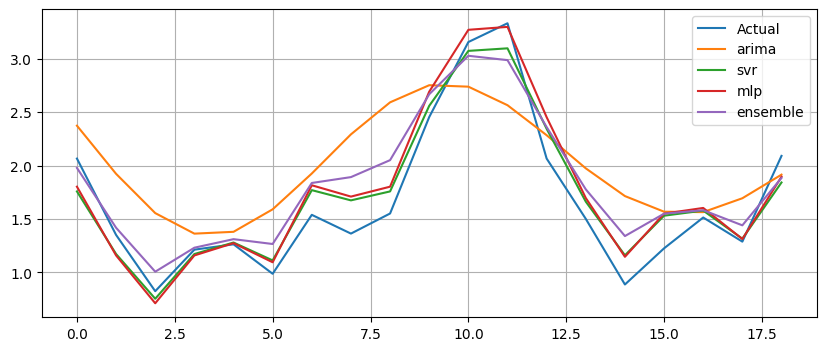

Generation 67: Fitness = 2.90434




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6778362851914423
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6904202477186703
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.15508909123774
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274564497572
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274564497572
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274379196651
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.847271319223063
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6869153460924464
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1550895497535523
SVRModel {'kernel': 'linear', 'c': 53.60252574637814, 'gamma': 'scale', 'epsilon': 0.4997971111002016} Fitness: 4.531685617095209
SVRModel {'kernel': 'rbf', 'c': 54.325737831576426, 'gamma': 'scale', 'epsilon': 0.49996233460500134} Fitness: 1.4933630285517858
SVRModel {'kernel': 'linear', 'c': 54.325737831576426, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5286

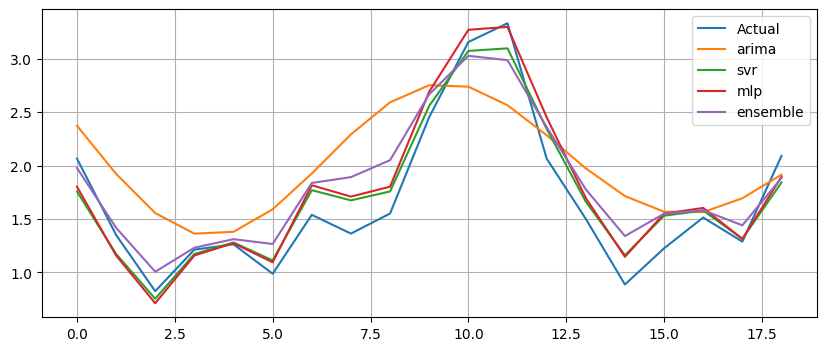

Generation 68: Fitness = 2.90440




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274611871997
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274465011928
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274465011928
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.84727512185895
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274611871997
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274465011928
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274385455762
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6816058976500052
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274564497572
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6817643948513683
SVRModel {'kernel': 'linear', 'c': 55.21905056667097, 'gamma': 'scale', 'epsilon': 0.4999342193080569} Fitness: 4.528623927492968
SVRModel {'kernel': 'linear', 'c': 54.445329715625256, 'gamma': 'scale', 'epsilon': 0.499825226397146} Fitness: 4.528502004805148
SVRModel {'kernel': 'linear', 'c': 54.36897223481199, 'gamma': 'scale', 'epsilon': 0.499825226397146} 

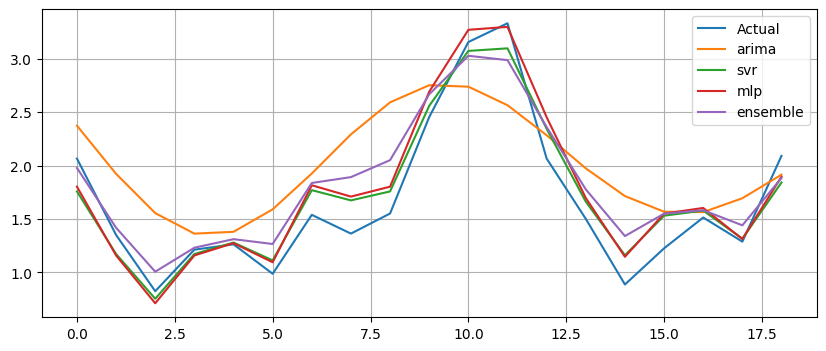

Generation 69: Fitness = 2.90439




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274564497572
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274379196651
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274611871997
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274564497572
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274611871997
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821875874116694
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682210633566275
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274564497572
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682578219628348
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274379196651
SVRModel {'kernel': 'linear', 'c': 54.0869002229895, 'gamma': 'scale', 'epsilon': 0.4998995292815578} Fitness: 4.528585192981697
SVRModel {'kernel': 'linear', 'c': 53.841363354965054, 'gamma': 'scale', 'epsilon': 0.4997594457052029} Fitness: 4.528428104929885
SVRModel {'kernel': 'linear', 'c': 55.21905056667097, 'gamma': 'scale', 'epsilon': 0.4999342193080569}

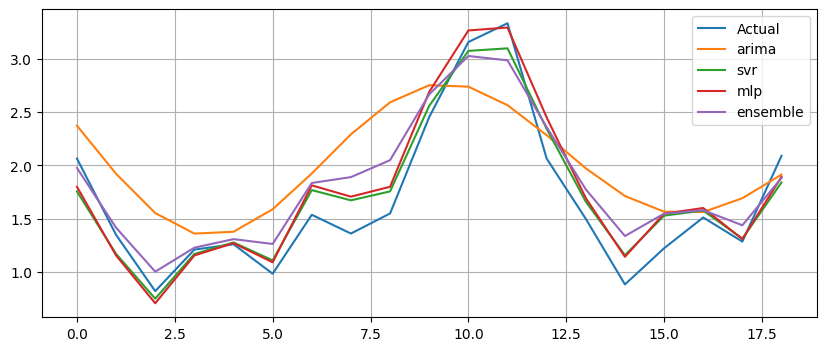

Generation 70: Fitness = 2.90479




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.8479489047137827
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822281226572728
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274567382074
ArimaModel {'p': 4, 'd': 0, 'q': 0} Fitness: 1.09148738670711
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682210654860983
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1681191067501515
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274611871997
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822106568338095
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6786838123091778
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.847271319223063
SVRModel {'kernel': 'linear', 'c': 59.56023547430297, 'gamma': 'scale', 'epsilon': 0.49993018523183114} Fitness: 4.674534718391577
SVRModel {'kernel': 'linear', 'c': 55.29540804748424, 'gamma': 'scale', 'epsilon': 0.4912315517548508} Fitness: 4.516849921347153
SVRModel {'kernel': 'linear', 'c': 59.56023547430297, 'gamma': 'scale', 'epsilon': 0.49990165388851654}

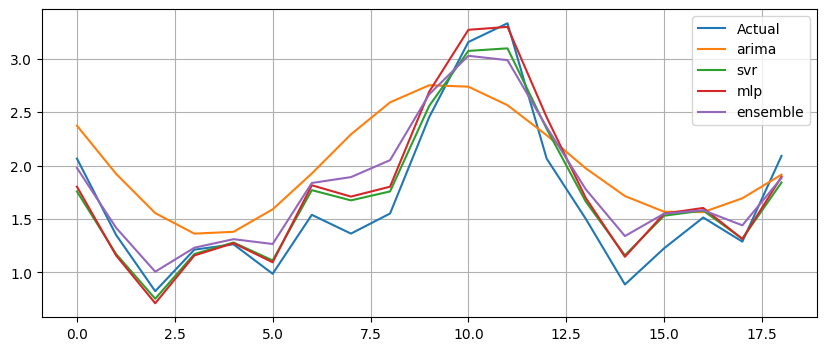

Generation 71: Fitness = 2.90440




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821725361226034
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821725360818485
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274611871997
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274606332532
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274606332532
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274606332532
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274606332532
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274606332532
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821725363792983
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682172535825352
SVRModel {'kernel': 'linear', 'c': 56.101675531592605, 'gamma': 'scale', 'epsilon': 0.49993235066777464} Fitness: 4.528645137430832
SVRModel {'kernel': 'linear', 'c': 57.741295618464804, 'gamma': 'scale', 'epsilon': 0.4999320538721134} Fitness: 4.528644806213966
SVRModel {'kernel': 'linear', 'c': 56.71303773020887, 'gamma': 'scale', 'epsilon': 0.4999342193080

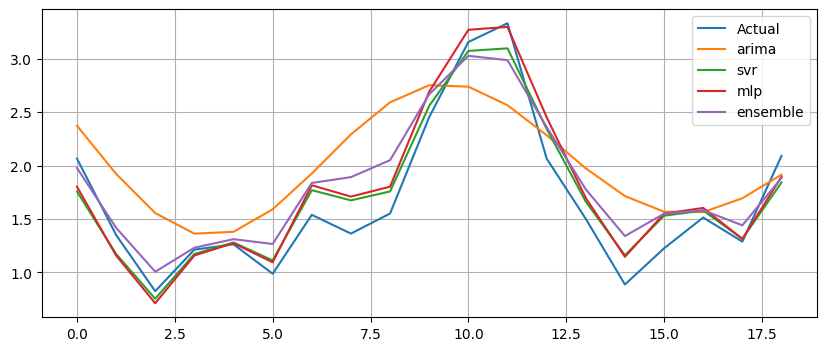

Generation 72: Fitness = 2.90440




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274611871997
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274611871997
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274606332532
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681918498659268
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274608944265
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274609258274
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274607778074
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6816548697799591
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6767775592630672
SVRModel {'kernel': 'linear', 'c': 51.44342156984891, 'gamma': 'scale', 'epsilon': 0.4999342193080569} Fitness: 4.528623927492968
SVRModel {'kernel': 'linear', 'c': 51.44342156984891, 'gamma': 'scale', 'epsilon': 0.4999342193080569} Fitness: 4.528623927492968
SVRModel {'kernel': 'linear', 'c': 59.56023547430297, 'gamma': 'scale', 'epsilon': 0.49993018523183114

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


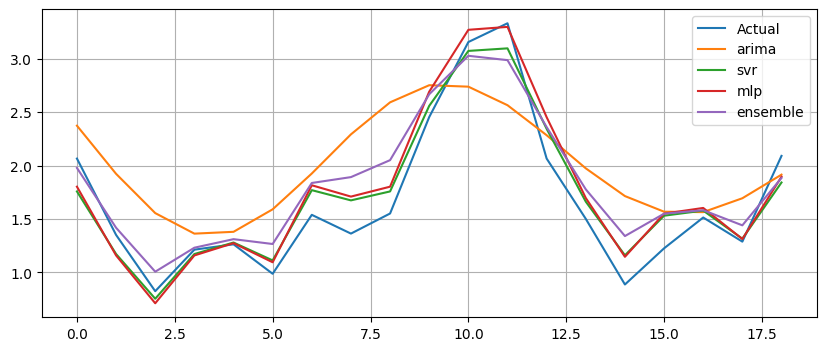

Generation 73: Fitness = 2.90440




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274609305048
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274608897496
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274610658297
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274610110641
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1550883600752309
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274611871997
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274608897496
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274608897496
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274608897496
SVRModel {'kernel': 'linear', 'c': 56.8863701354563, 'gamma': 'scale', 'epsilon': 0.49993235066777464} Fitness: 4.528621842673493
SVRModel {'kernel': 'linear', 'c': 56.956601014601105, 'gamma': 'scale', 'epsilon': 0.4999320538721134} Fitness: 4.528621511524497
SVRModel {'kernel': 'linear', 'c': 56.86577435266575, 'gamma': 'scale', 'epsilon': 0.499933335936190

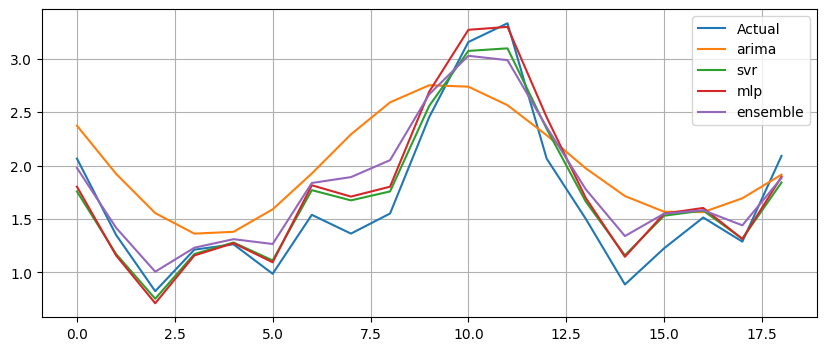

Generation 74: Fitness = 2.90440




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274658297194
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821897334408977
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274607507424
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274609482442
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274611871997
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274611871997
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274606332532
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274610658297
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274606332532
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274611871997
SVRModel {'kernel': 'linear', 'c': 56.8863701354563, 'gamma': 'scale', 'epsilon': 0.4999678025225359} Fitness: 4.5286613631850585
SVRModel {'kernel': 'linear', 'c': 56.101675531592605, 'gamma': 'scale', 'epsilon': 0.4999645481452387} Fitness: 4.528649268100779
SVRModel {'kernel': 'linear', 'c': 58.8166254920133, 'gamma': 'scale', 'epsilon': 0.499931041324352

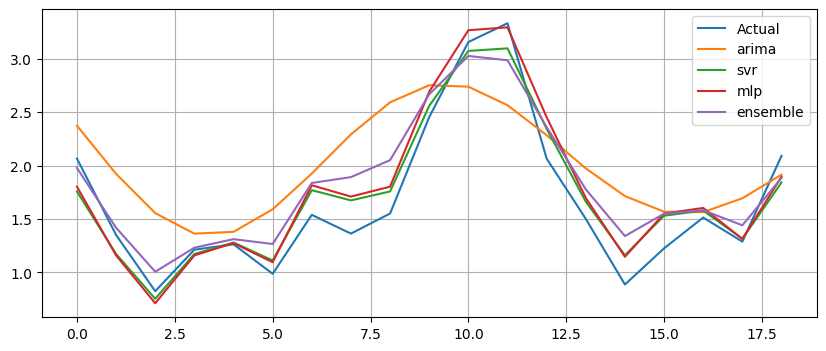

Generation 75: Fitness = 2.90249




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274611871997
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822346983309078
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6816721849869765
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6819477271871865
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6876562520396665
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274639455816
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227465070168
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227461491396
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274658297194
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227465377416
SVRModel {'kernel': 'linear', 'c': 56.37920357305109, 'gamma': 'scale', 'epsilon': 0.4999342193080569} Fitness: 4.528623927492968
SVRModel {'kernel': 'linear', 'c': 51.76309208093954, 'gamma': 'scale', 'epsilon': 0.4797269501092581} Fitness: 4.495074745888659
SVRModel {'kernel': 'linear', 'c': 53.55181387206387, 'gamma': 'scale', 'epsilon': 0.4999342193080569} 

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


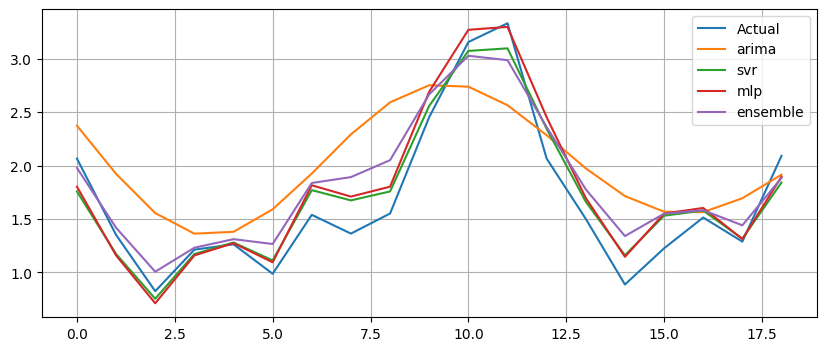

Generation 76: Fitness = 2.90440




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2421471899098355
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.1115451734831003
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274658297194
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815436982321508
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274623095512
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1550881775952302
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274655706455
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274656363627
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274658297194
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6817825447793995
SVRModel {'kernel': 'linear', 'c': 54.86364833864612, 'gamma': 'scale', 'epsilon': 0.4999678025225359} Fitness: 4.543424368203118
SVRModel {'kernel': 'poly', 'c': 51.993409081455574, 'gamma': 'scale', 'epsilon': 0.4999445462768269} Fitness: 1.1317118640590431
SVRModel {'kernel': 'linear', 'c': 55.5209583916516, 'gamma': 'scale', 'epsilon': 0.4999678025225359

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


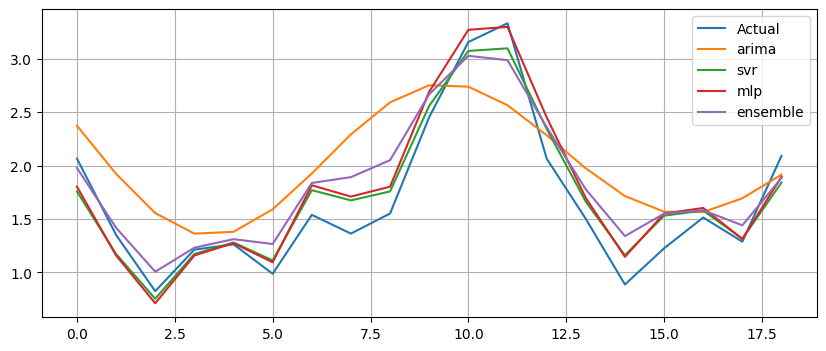

Generation 77: Fitness = 2.90441




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.687725868546796
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274642461947
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274644119135
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274656634013
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6819369931326664
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.1714653104162212
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274645180575
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6817944738858497
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.1681843767418674
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822479291141241
SVRModel {'kernel': 'linear', 'c': 54.794683524235964, 'gamma': 'scale', 'epsilon': 0.4999678025225359} Fitness: 4.540186262041163
SVRModel {'kernel': 'linear', 'c': 54.46356580826173, 'gamma': 'scale', 'epsilon': 0.4999563924513042} Fitness: 4.528648651162567
SVRModel {'kernel': 'linear', 'c': 54.39460099385157, 'gamma': 'scale', 'epsilon': 0.499957588695160

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


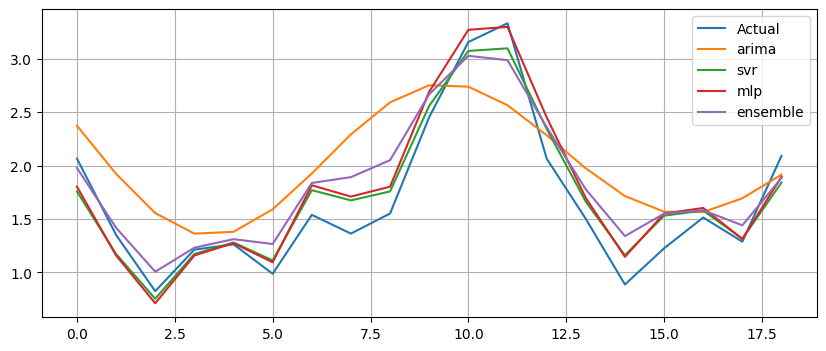

Generation 78: Fitness = 2.90441




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274642461947
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1550881775952302
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681794474158622
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6777132307276177
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274642461947
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274642461947
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.24214723125833
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227465003854
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6904183626730054
SVRModel {'kernel': 'linear', 'c': 54.39460099385157, 'gamma': 'scale', 'epsilon': 0.4999563924513042} Fitness: 4.528648651162567
SVRModel {'kernel': 'linear', 'c': 54.39460099385157, 'gamma': 'scale', 'epsilon': 0.4999563924513042} Fitness: 4.546961580761288
SVRModel {'kernel': 'linear', 'c': 54.794683524235964, 'gamma': 'scale', 'epsilon': 0.4999678025225359} F

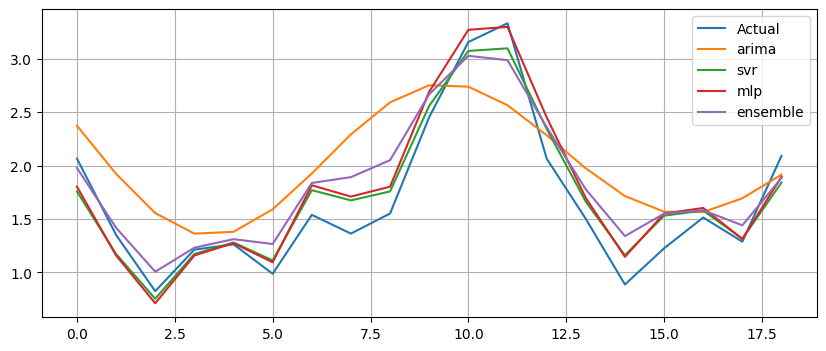

Generation 79: Fitness = 2.90441




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274655569474
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681694132436162
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274658297194
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274644969617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274653055025
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6820628651584733
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274642461947
ArimaModel {'p': 1, 'd': 0, 'q': 3} Fitness: 1.0620304211715905
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274642461947
SVRModel {'kernel': 'linear', 'c': 56.51591140875615, 'gamma': 'scale', 'epsilon': 0.49996584034209834} Fitness: 4.528659177618276
SVRModel {'kernel': 'linear', 'c': 54.39460099385157, 'gamma': 'scale', 'epsilon': 0.4999563924513042} Fitness: 4.529047519085102
SVRModel {'kernel': 'linear', 'c': 54.695782674953364, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.5

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


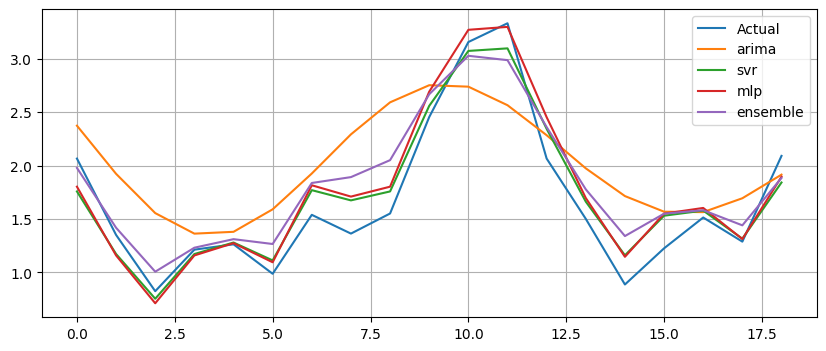

Generation 80: Fitness = 2.90442




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274687851926
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.8472676803151209
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815921768453348
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274642461947
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274653055025
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.11149331474777
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.68215941394769
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.676832264524297
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274645890283
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681757465880963
SVRModel {'kernel': 'linear', 'c': 54.39460099385157, 'gamma': 'scale', 'epsilon': 0.4999889762414303} Fitness: 4.528684933992742
SVRModel {'kernel': 'linear', 'c': 56.51591140875615, 'gamma': 'scale', 'epsilon': 0.4999674162098739} Fitness: 4.674548844302386
SVRModel {'kernel': 'linear', 'c': 54.39460099385157, 'gamma': 'scale', 'epsilon': 0.4999563924513042} Fit

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


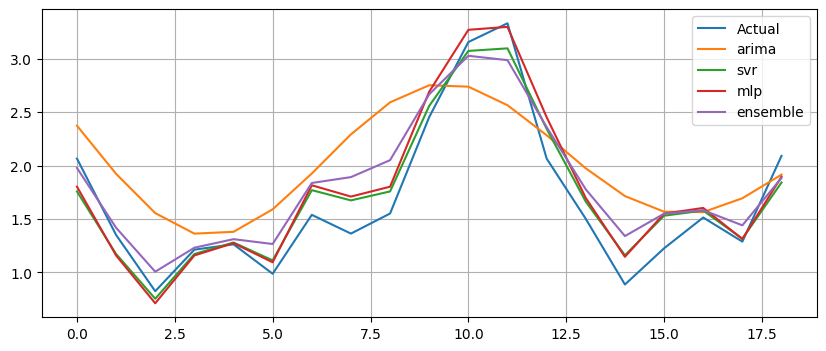

Generation 81: Fitness = 2.90441




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6877868307698907
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274654858014
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815902574525812
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2421465114481278
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1462321731501228
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274642461947
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274657760012
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6825782274247856
SVRModel {'kernel': 'linear', 'c': 54.496702537661704, 'gamma': 'scale', 'epsilon': 0.4471939227254239} Fitness: 4.4082217859198884
SVRModel {'kernel': 'linear', 'c': 56.344332986334734, 'gamma': 'scale', 'epsilon': 0.4999653283314638} Fitness: 4.5286586072825
SVRModel {'kernel': 'linear', 'c': 54.49933752036038, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.52

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


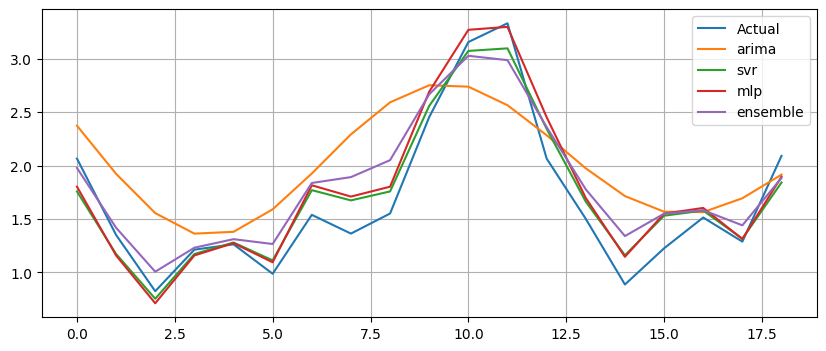

Generation 82: Fitness = 2.90441




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274698286024
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815902594813021
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274685997478
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1550880916301918
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.1714653104162212
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274642461947
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274657760012
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274646267734
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274653943077
SVRModel {'kernel': 'linear', 'c': 54.39460099385157, 'gamma': 'scale', 'epsilon': 0.4999964140902985} Fitness: 4.528693208040018
SVRModel {'kernel': 'linear', 'c': 55.96763779660418, 'gamma': 'scale', 'epsilon': 0.49997100211957535} Fitness: 4.52918399609128
SVRModel {'kernel': 'linear', 'c': 54.46787461021732, 'gamma': 'scale', 'epsilon': 0.4999876522874388

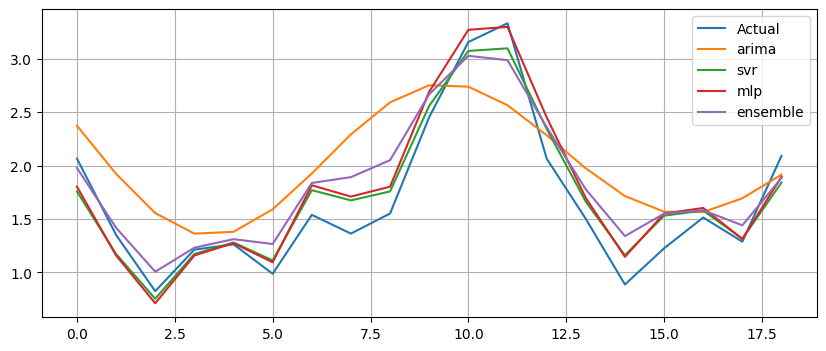

Generation 83: Fitness = 2.90441




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0888998546271795
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274659601322
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227466049394
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6869153598850803
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1550881775952302
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274659601322
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274698286024
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274698286024
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274659601322
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274642461947
SVRModel {'kernel': 'linear', 'c': 54.41861285376257, 'gamma': 'scale', 'epsilon': 0.4999964140902985} Fitness: 4.55381443253813
SVRModel {'kernel': 'linear', 'c': 54.40205204408363, 'gamma': 'scale', 'epsilon': 0.4999687401638654} Fitness: 4.528662407498406
SVRModel {'kernel': 'linear', 'c': 55.00212415200857, 'gamma': 'scale', 'epsilon': 0.4999693817618553}

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


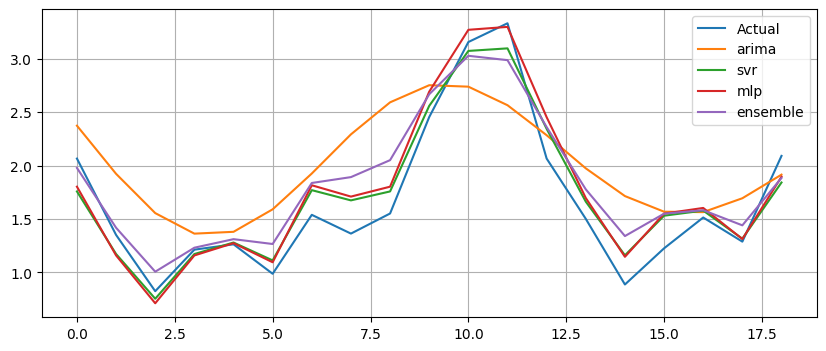

Generation 84: Fitness = 2.90442




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274698286024
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274702423914
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274659601322
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274698286024
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274693363983
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274651406348
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.68222747006831
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1550878903718687
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274674661084
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227468403479
SVRModel {'kernel': 'linear', 'c': 54.45442620034728, 'gamma': 'scale', 'epsilon': 0.4999964140902985} Fitness: 4.528693208040018
SVRModel {'kernel': 'linear', 'c': 55.48885089294705, 'gamma': 'scale', 'epsilon': 0.4999993584020101} Fitness: 4.528696482525713
SVRModel {'kernel': 'linear', 'c': 55.33341926785707, 'gamma': 'scale', 'epsilon': 0.4999687401638654} 

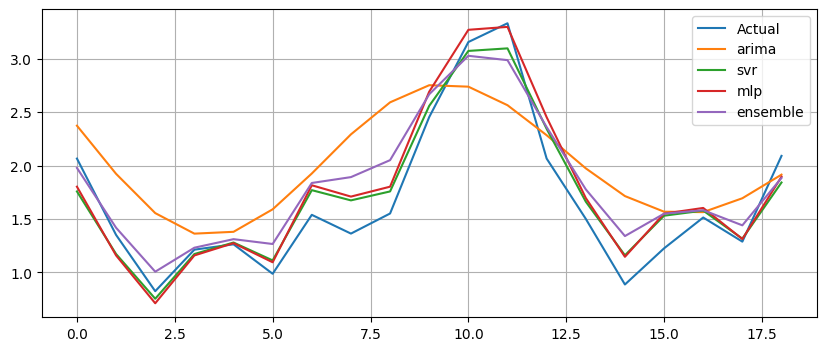

Generation 85: Fitness = 2.90442




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815436982321508
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227468403479
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274697313393
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274686738228
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274701157323
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274701292037
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.68222747000258
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227468403479
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274700323632
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6841358355543758
SVRModel {'kernel': 'linear', 'c': 54.45442620034728, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.530098789561736
SVRModel {'kernel': 'linear', 'c': 55.00212415200857, 'gamma': 'scale', 'epsilon': 0.49998625038847516} Fitness: 4.5286819009255
SVRModel {'kernel': 'linear', 'c': 55.52466423953176, 'gamma': 'scale', 'epsilon': 0.49999572157678995} Fitness: 4.52869

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


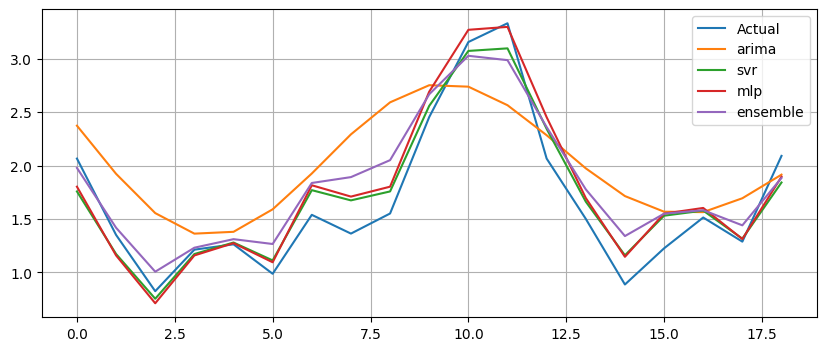

Generation 86: Fitness = 2.90442




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274700323632
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274701157323
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274701292037
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274701292037
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274702473625
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822167169157658
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6768322643208837
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470123853
ArimaModel {'p': 4, 'd': 0, 'q': 1} Fitness: 1.094635042710726
SVRModel {'kernel': 'linear', 'c': 54.721857092181985, 'gamma': 'scale', 'epsilon': 0.4999978643269074} Fitness: 4.528694820965113
SVRModel {'kernel': 'linear', 'c': 55.1911707934074, 'gamma': 'scale', 'epsilon': 0.49999845748140503} Fitness: 4.528695480626777
SVRModel {'kernel': 'linear', 'c': 55.519100100652, 'gamma': 'scale', 'epsilon': 0.49999855331675885} 

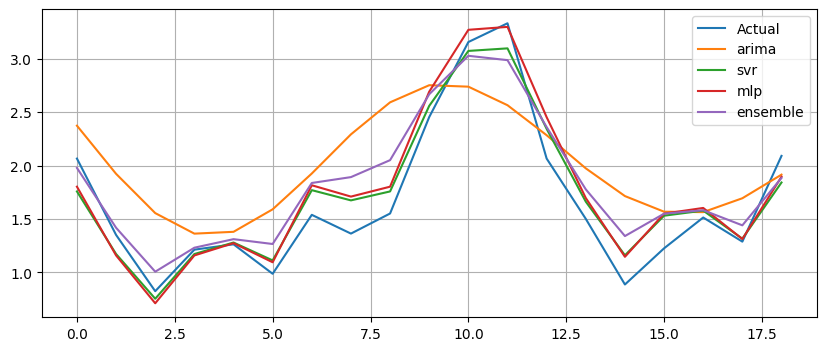

Generation 87: Fitness = 2.90442




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470247244
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470247244
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274701292037
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274701292037
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470247244
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470247244
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274701292037
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274701292037
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470247244
SVRModel {'kernel': 'linear', 'c': 61.22020984309306, 'gamma': 'scale', 'epsilon': 0.4999993929126284} Fitness: 4.528696520903514
SVRModel {'kernel': 'linear', 'c': 55.52466423953176, 'gamma': 'scale', 'epsilon': 0.4999993929126284} Fitness: 4.528696520903514
SVRModel {'kernel': 'linear', 'c': 55.88106929164621, 'gamma': 'scale', 'epsilon': 0.49999855331675885} Fi

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


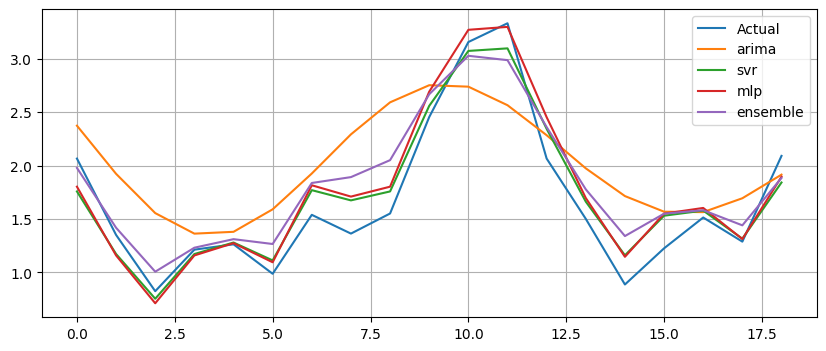

Generation 88: Fitness = 2.90442




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6767775687059343
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274702702995
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470247244
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470247244
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470247244
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470247244
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470247244
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470247244
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470247244
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470247244
SVRModel {'kernel': 'linear', 'c': 55.52466423953176, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.533684699627309
SVRModel {'kernel': 'linear', 'c': 54.45442620034728, 'gamma': 'scale', 'epsilon': 0.4999995568735246} Fitness: 4.528696703236614
SVRModel {'kernel': 'linear', 'c': 55.52466423953176, 'gamma': 'scale', 'epsilon': 0.4999993929126284} Fitness: 4.528696520

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


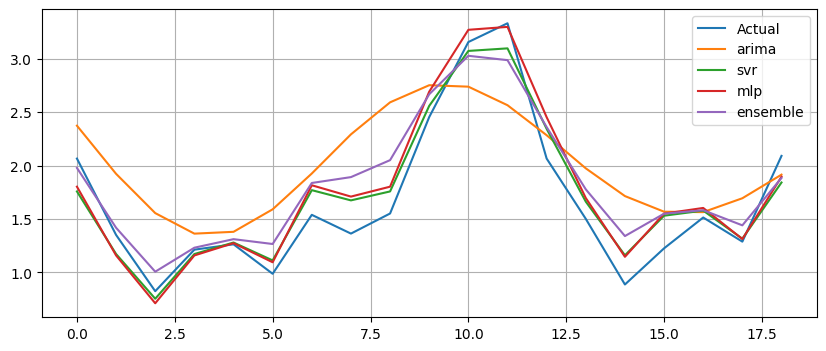

Generation 89: Fitness = 2.90442




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6795028391734819
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821682523898895
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6876570652493679
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682042368081619
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274702759326
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274702702995
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470247244
SVRModel {'kernel': 'linear', 'c': 55.52466423953176, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528697196009063
SVRModel {'kernel': 'linear', 'c': 55.52466423953176, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528697196009063
SVRModel {'kernel': 'linear', 'c': 55.52466423953176, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.532254382544311
SVRModel {'kernel': 

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


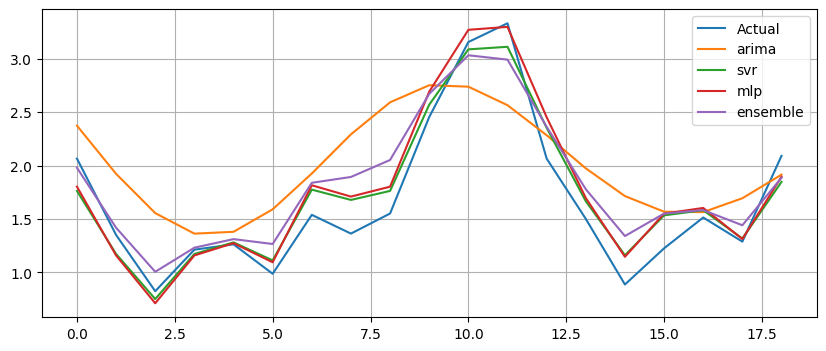

Generation 90: Fitness = 2.90099




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.68204236800188
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274703262046
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470253655
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470330016
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470329584
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.68204317357324
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
SVRModel {'kernel': 'linear', 'c': 55.52466423953176, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528697196009063
SVRModel {'kernel': 'linear', 'c': 55.52466423953176, 'gamma': 'scale', 'epsilon': 0.4999993929126284} Fitness: 4.528751551195838
SVRModel {'kernel': 'linear', 'c': 55.52466423953176, 'gamma': 'scale', 'epsilon': 0.49999995440564693} Fitness: 4.52869714530

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


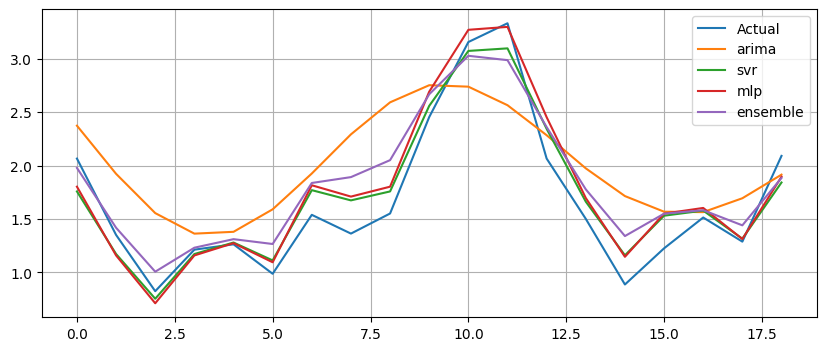

Generation 91: Fitness = 2.90442




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470247244
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682296811584563
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6820630559297762
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274703181594
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2421465114481278
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6815933900376023
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274703321416
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274703304911
SVRModel {'kernel': 'linear', 'c': 55.52466423953176, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528697196009063
SVRModel {'kernel': 'linear', 'c': 55.52466423953176, 'gamma': 'scale', 'epsilon': 0.4999993929126284} Fitness: 4.528696520903514
SVRModel {'kernel': 'linear', 'c': 59.88074084209943, 'gamma': 'scale', 'epsilon': 0.443881091537887} Fitness: 4.385594

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


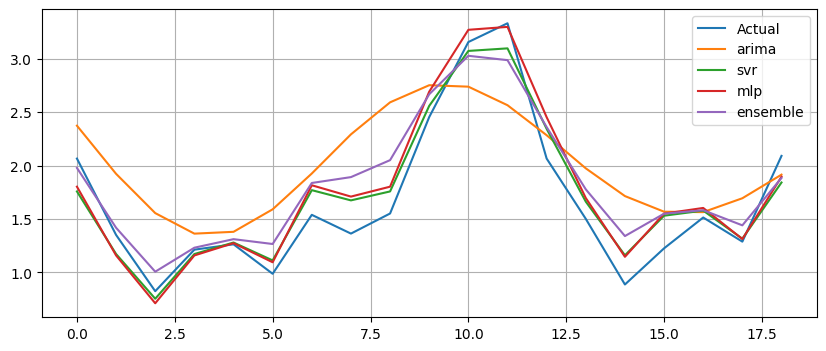

Generation 92: Fitness = 2.90442




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6817461473613267
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6816667962401064
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274702616988
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1550878740383428
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822331853692285
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470311168
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274702831452
SVRModel {'kernel': 'linear', 'c': 59.88074084209943, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529087833160473
SVRModel {'kernel': 'linear', 'c': 59.88074084209943, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528697196009063
SVRModel {'kernel': 'linear', 'c': 59.8629983902884, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528697196009063
SVRModel {'kernel': 

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


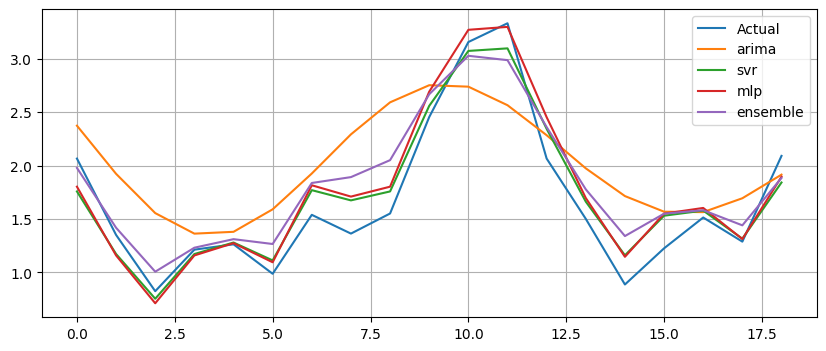

Generation 93: Fitness = 2.90442




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.678368489106964
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274703324882
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.686915359975306
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274703324882
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6791465177013942
SVRModel {'kernel': 'linear', 'c': 59.60383217621846, 'gamma': 'scale', 'epsilon': 0.4999999990852143} Fitness: 4.530389133484013
SVRModel {'kernel': 'linear', 'c': 55.67563346895287, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528697196009063
SVRModel {'kernel': 'linear', 'c': 59.88074084209943, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528697196009063
SVRMode

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


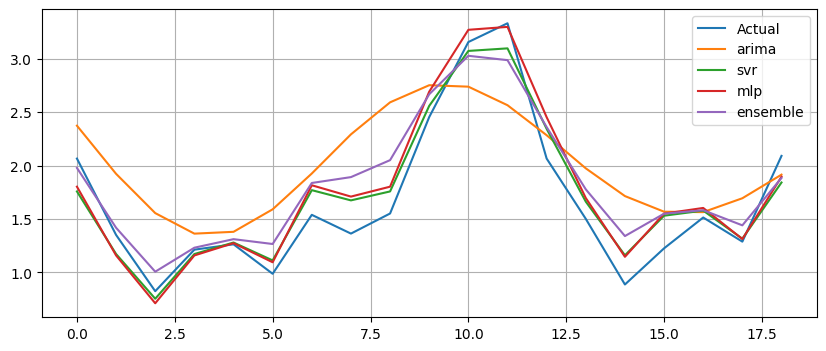

Generation 94: Fitness = 2.90442




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274703324882
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 2.1113164992401505
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274703324882
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6822274703324882
SVRModel {'kernel': 'linear', 'c': 59.87353229386079, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528697196009063
SVRModel {'kernel': 'linear', 'c': 59.87020693852705, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528697196009063
SVRModel {'kernel': 'linear', 'c': 59.60383217621846, 'gamma': 'scale', 'epsilon': 0.4999999990852143} Fitness: 4.528697194991799
SVRMod

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


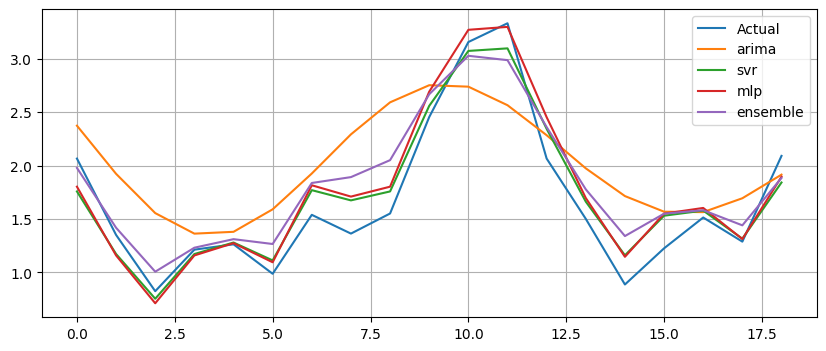

Generation 95: Fitness = 2.90442




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6795028391734819
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2421465114481278
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6821615239606846
SVRModel {'kernel': 'linear', 'c': 59.877214855453666, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528697196009063
SVRModel {'kernel': 'linear', 'c': 59.87373292517281, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.532254382544311
SVRModel {'kernel': 'linear', 'c': 59.88074084209943, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528697196009063
SVRModel {'kernel': '

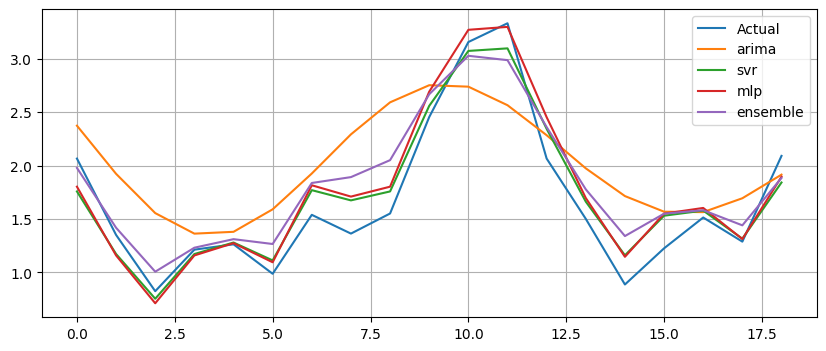

Generation 96: Fitness = 2.90442




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1550878740319757
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.8472641086665267
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
SVRModel {'kernel': 'linear', 'c': 59.88074084209943, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528697196009063
SVRModel {'kernel': 'linear', 'c': 59.87373292517281, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528697196009063
SVRModel {'kernel': 'linear', 'c': 59.88074084209943, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.547009815958107
SVRModel {'kernel': 'li

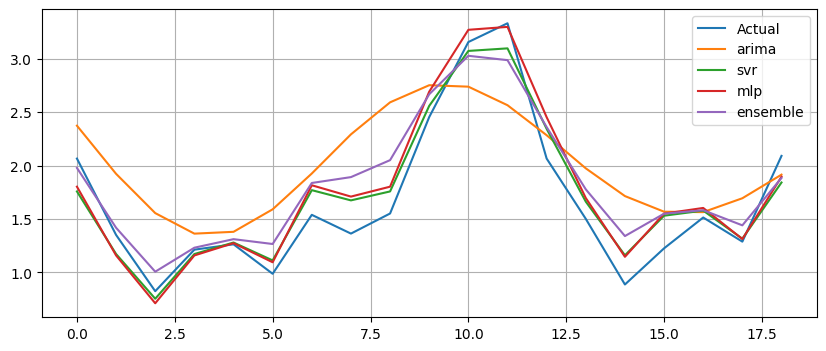

Generation 97: Fitness = 2.90442




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6778363127166638
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6877258730496933
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6819568323125575
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
SVRModel {'kernel': 'linear', 'c': 59.87763148646492, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528697196009063
SVRModel {'kernel': 'linear', 'c': 59.88074084209943, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.531913886563772
SVRModel {'kernel': 'linear', 'c': 59.88059168199532, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528697196009063
SVRModel {'kernel': 'l

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


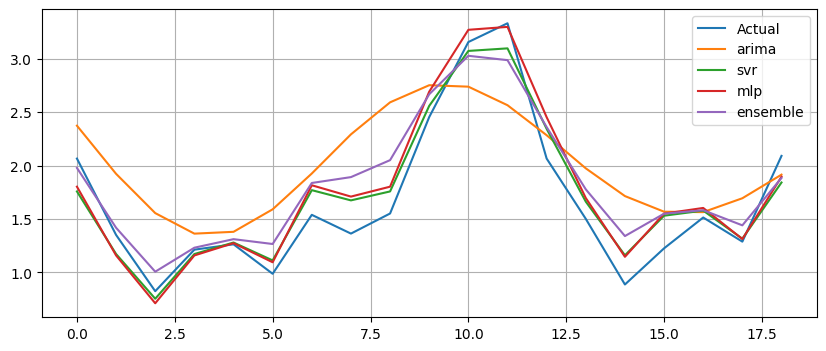

Generation 98: Fitness = 2.90442




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6817013239733691
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.681701578639505
ArimaModel {'p': 4, 'd': 1, 'q': 3} Fitness: 1.1550878740319757
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 0, 'd': 0, 'q': 3} Fitness: 0.8472641086665267
ArimaModel {'p': 3, 'd': 0, 'q': 3} Fitness: 1.1714644967098193
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6816682048042582
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6818216431944137
SVRModel {'kernel': 'linear', 'c': 59.88074084209943, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528697196009063
SVRModel {'kernel': 'linear', 'c': 59.87684228080731, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529277247339886
SVRModel {'kernel': 'linear', 'c': 59.88074084209943, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.529051341333202
SVRModel {'kernel':

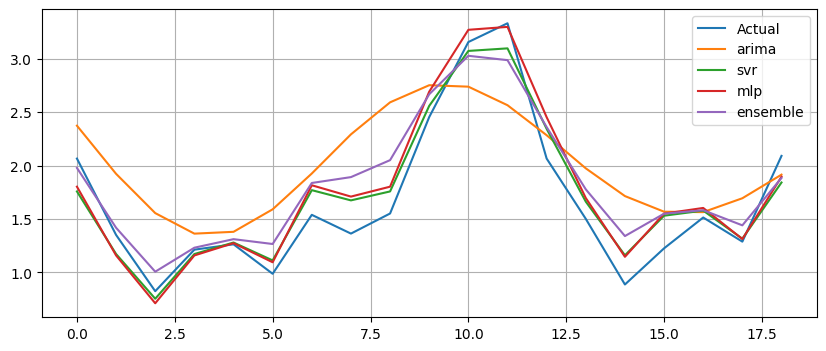

Generation 99: Fitness = 2.90442




/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 4} Fitness: 1.0791463039850298
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.6767775687059343
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 2, 'd': 0, 'q': 3} Fitness: 1.169224505118109
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.690423135430992
ArimaModel {'p': 1, 'd': 0, 'q': 3} Fitness: 1.0739473212517867
SVRModel {'kernel': 'linear', 'c': 60.059647846082214, 'gamma': 'scale', 'epsilon': 0.4645419580986039} Fitness: 4.484586506207291
SVRModel {'kernel': 'linear', 'c': 60.38369766293988, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528697196009063
SVRModel {'kernel': 'linear', 'c': 60.0136941345349, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.533684699627309
SVRMode

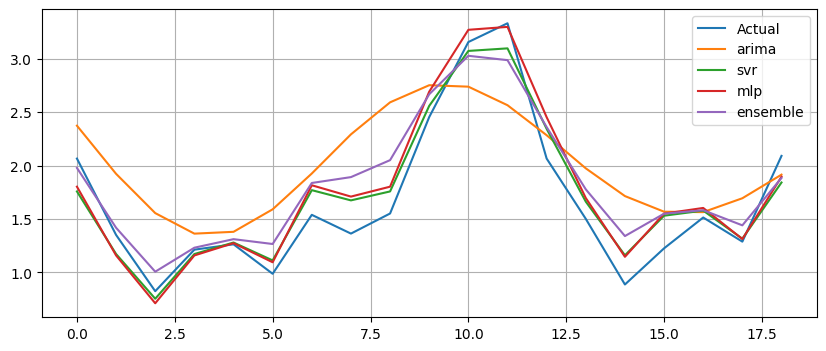

Generation 100: Fitness = 2.90442




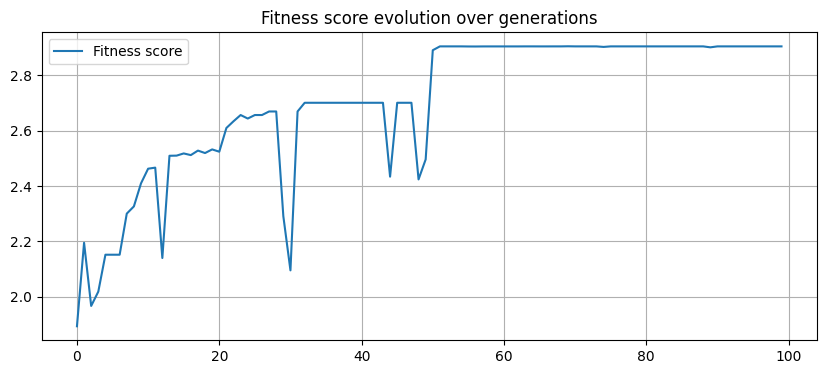

In [17]:
pool_of_models = [ArimaModel, SVRModel, MLPModel]
population_size = 10
num_generations = 100
mutation_rate = 0.2

print('Initializing population...')
population = init_population(population_size, pool_of_models)

print('Population created: ')
print_population(population)

fitness_score_collection = []

for generation in range(num_generations):

    # individual_evaluation(population, data)
    individual_evaluation_with_diversity(population, X_train_scaled, y_train_scaled, X_val_scaled, y_val_scaled)
    print_population(population)

    fitness_score, _, _, _ = team_evaluation(population, X_val_scaled, y_val_scaled)
    fitness_score_collection.append(fitness_score)

    print(f"Generation {generation + 1}: Fitness = {fitness_score:.5f}")
    print('=============================\n\n')

    # Selection by tournament
    selected_pop = tournament_selection(population)
    # print('selected population:')
    # print_population(selected_pop)

    # Crossover
    crossed_pop = crossover(selected_pop)
    # print('Crossed population:')
    # print_population(crossed_pop)
    
    # Mutation
    population = mutation(crossed_pop)
    # print_population(population)

plt.figure(figsize=(10, 4))
plt.plot(fitness_score_collection, label='Fitness score')
plt.title('Fitness score evolution over generations')
plt.grid()
plt.legend()
plt.show()

# Test

In [18]:
individual_evaluation_with_diversity(population, X_train_scaled, y_train_scaled, X_val_scaled, y_val_scaled)
print_population(population)


print('Best models:')
best_models = {}
# Select the best individual of each subpopulation
for model in population.keys():
    best_ind = None
    for individual in population[model]:
        best_ind = individual if best_ind is None or individual.fitness_score > best_ind.fitness_score else best_ind
    
    best_models[best_ind.get_name()] = best_ind

best_models

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Divers

ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 2} Fitness: 1.2421465114481278
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682035945294179
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617
SVRModel {'kernel': 'linear', 'c': 59.99927559445619, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528697196009063
SVRModel {'kernel': 'linear', 'c': 59.89126082088602, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.528697196009063
SVRModel {'kernel': 'linear', 'c': 60.0136941345349, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.543459518062517
SVRModel {'kernel': 'line

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


{'arima': ArimaModel {'p': 4, 'd': 0, 'q': 3} Fitness: 1.682227470332617,
 'svr': SVRModel {'kernel': 'linear', 'c': 60.0136941345349, 'gamma': 'scale', 'epsilon': 0.5} Fitness: 4.543459518062517,
 'mlp': MLPModel {'hidden_layer_sizes': 20, 'learning_rate': 0.020490629202846694} Fitness: 4.229969831422843}

/Users/fcma/workspace/personal/Cooperative-Coevolutionary-Algorithms-for-Model-Diversity/venv/lib/python3.10/site-packages/statsmodels/base/model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


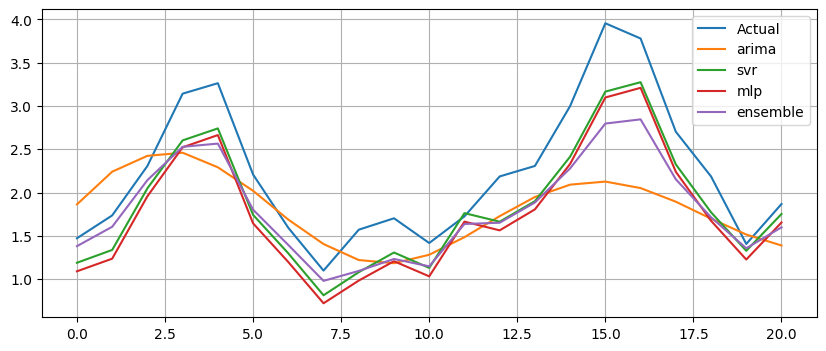

RMSE: 80.82424904192959
MSE: 6532.559233191857


In [19]:
from sklearn.preprocessing import MinMaxScaler

X_train_val = pd.concat([X_train.copy(), X_val.copy()])
y_train_val = pd.concat([y_train.copy(), y_val.copy()])



X_train_scaler = StandardScaler()
y_train_scaler = StandardScaler()

X_train_scaled = X_train_scaler.fit_transform(np.array(X_train_val).reshape(-1,1))
X_test_scaled = X_train_scaler.transform(np.array(X_test).reshape(-1,1))

y_train_scaled = y_train_scaler.fit_transform(np.array(y_train_val).reshape(-1,1)).ravel()
y_test_scaled = y_train_scaler.transform(np.array(y_test).reshape(-1,1)).ravel()

models = {
    'arima': ArimaModel(ARIMA, best_models['arima'].hparams),
    'svr': SVRModel(SVR, best_models['svr'].hparams),
    'mlp': MLPModel(MLPRegressor, best_models['mlp'].hparams)
}

for model_name in models.keys():
    models[model_name].train(X_train_scaled, y_train_scaled)

ensemble = EnsembleModel(None, models)
pred = ensemble.predict(X_test_scaled)


models['ensemble'] = ensemble
plot_forecasts(models.values(), y_test_scaled)

pred_transf = X_train_scaler.inverse_transform(pred.reshape(-1,1))

mse = mean_squared_error(pred_transf, y_test)
rmse = np.sqrt(mean_squared_error(pred_transf, y_test))

print('RMSE: {}'.format(rmse))
print('MSE: {}'.format(mse))
